# **Project Name**    -  **ONLINE RETAIL CLUSTERING**

#### Project Type - Clustering
#### Name - Prachi

# **Github Link**  -

[Click here](https://github.com/Prachi957/Online-Retail-Clustering/blob/main/Online_Retail_Clustering_Project.ipynb)

# **Project Summary -**

This dataset consists of transactions from a UK-based online retail store between December 2010 and December 2011. Each row represents a product purchased during a transaction and includes attributes like invoice number, product code, product description, quantity purchased, invoice date, unit price, customer ID, and customer country.

By grouping customers into meaningful segments, we can explore what types of buyers exist — such as high-spending frequent buyers, one-time customers, or inactive users. Additional integration with external datasets such as customer demographics or product categories could enhance the depth of segmentation and business value further.

We will begin by cleaning the dataset: removing transactions with missing CustomerID, dropping cancelled orders (identified by invoice numbers starting with "C"), and filtering out invalid quantity or price values. Then, we'll engineer new features using the RFM (Recency, Frequency, Monetary) model — calculating how recently each customer made a purchase, how often they made purchases, and how much they spent in total.

We will apply feature scaling to normalize the RFM values. To determine the optimal number of clusters, we will use the Elbow Method, Silhouette Score, and optionally Dendrograms for hierarchical clustering. Models to be used include KMeans Clustering and Agglomerative Clustering.

To visualize the customer segments, we will apply PCA (Principal Component Analysis) to reduce dimensions and plot the clusters in 2D space. We may also generate word clouds or summary statistics per cluster to understand the differences in customer behavior.

This clustering analysis can help identify VIP customers, one-time buyers, and at-risk customers — enabling more targeted marketing strategies and personalized outreach based on data-driven insights.



# **Problem Statement**

The dataset presents an interesting opportunity to explore customer purchasing behavior and segment customers based on their shopping habits. Since the data includes both frequency and value of transactions, it becomes highly suitable for behavioral clustering using unsupervised learning techniques like RFM analysis and KMeans clustering. Identifying customer segments such as loyal buyers, one-time customers, and high-spending users can provide critical insights into retention and targeting strategies.

Integrating this dataset with external sources such as customer demographic profiles or product categories can further enhance the analysis and help businesses personalize offers, optimize campaigns, and improve customer lifetime value.

## <b>In this  project, you are required to do </b>
1. **Exploratory Data Analysis** - Understanding the overall structure of the dataset, transaction volumes, popular products, and customer distribution across countries.

2. **Analyzing customer behavior** - Identifying how frequently customers purchase, how recently they were active, and how much they spend overall.

3. **Determining if the business has a large proportion of one-time vs repeat customers** - Investigating patterns that show customer loyalty, engagement, and churn.

4. **Clustering similar customers by extracting behavior-based features** - Using Recency, Frequency, and Monetary values to group customers with similar shopping behavior for targeted marketing and personalization strategies.

# **Attribute Information**

*  **InvoiceNo**: Unique identifier for each transaction; starts with 'C' if the transaction was cancelled.

*  **StockCode**: Unique product/item code for the purchased item.

*   **Description**: Text description of the product/item.

*   **Quantity**: Number of units purchased per product in the transaction.

*   **UnitPrice**: Price per unit of the product (in GBP).

*   **CustomerID**: Unique identifier for each customer.

*   **Country**: Name of the country where the customer is located.

# ***Let's Begin !***

# Import Libraries

In [863]:
# import the dependancy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm
import scipy.cluster.hierarchy as sch
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# ***1. Dataset Loading***

In [864]:
# import the dataset
df = pd.read_csv('/content/drive/MyDrive/Copy of Online Retail.xlsx - Online Retail.csv')

## Dataset First View

In [865]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/10 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/10 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/10 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/10 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/10 8:26,3.39,17850.0,United Kingdom


In [866]:
df.tail()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/11 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/11 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/11 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/11 12:50,4.15,12680.0,France
541908,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,12/9/11 12:50,4.95,12680.0,France


## Dataset Rows & Columns count

In [867]:
# Check the shape of the dataset
df.shape

(541909, 8)

## Data describe

In [868]:
#To check distribution describing dataset
df.describe(include='all')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
count,541909,541909,540455,541909.000000,541909,541909.000000,406829.000000,541909
unique,25900,4070,4223,NaN,23260,NaN,NaN,38
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,NaN,10/31/11 14:41,NaN,NaN,United Kingdom
freq,1114,2313,2369,NaN,1114,NaN,NaN,495478
mean,NaN,NaN,NaN,9.552250,NaN,4.611114,15287.690570,NaN
std,NaN,NaN,NaN,218.081158,NaN,96.759853,1713.600303,NaN
min,NaN,NaN,NaN,-80995.000000,NaN,-11062.060000,12346.000000,NaN
25%,NaN,NaN,NaN,1.000000,NaN,1.250000,13953.000000,NaN
50%,NaN,NaN,NaN,3.000000,NaN,2.080000,15152.000000,NaN
75%,NaN,NaN,NaN,10.000000,NaN,4.130000,16791.000000,NaN


# Dataset Information

In [869]:
# print the info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [870]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [871]:
# checking for null/missing values
df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,1454
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,135080
Country,0


<Axes: >

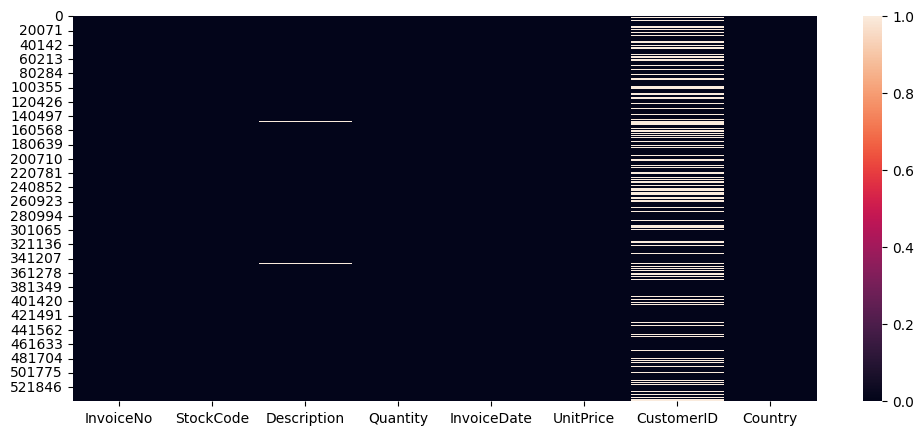

In [872]:
# let's visualizing  the null values
plt.figure(figsize=(12,5))
sns.heatmap(df.isna())



*   We have 541909 rows in our dataset and 8 columns.
*   There are 1454 null values in Description column and 135080 null values in CustomerID.



# ***2. Data Wrangling***

#### Missing Values/Null Values

In [873]:
# Check for null values %.
for col in df.columns:
  null_rate = df[col].isnull().sum() / len(df) * 100
  if null_rate > 0:
    print(f'The null values in {col} column are : {df[col].isnull().sum()},  Percentage:- {null_rate}%')

The null values in Description column are : 1454,  Percentage:- 0.2683107311375157%
The null values in CustomerID column are : 135080,  Percentage:- 24.926694334288598%


In [874]:
# Dropping null values
df.dropna(inplace=True)

In [875]:
#Check null values
df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0


#### Duplicate Values

In [876]:
# Previewing come of duplicated values
df.duplicated().sum()

np.int64(5225)

In [877]:
df[df.duplicated(keep=False)].head(8)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,12/1/10 11:45,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,12/1/10 11:45,2.10,17908.0,United Kingdom
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,12/1/10 11:45,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,12/1/10 11:45,1.25,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,12/1/10 11:45,2.95,17908.0,United Kingdom
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,12/1/10 11:45,2.10,17908.0,United Kingdom
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,12/1/10 11:45,2.95,17908.0,United Kingdom
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,12/1/10 11:45,4.95,17908.0,United Kingdom


In [878]:
# Dropping duplicated values
df.drop_duplicates(inplace=True)

In [879]:
# Change the data type of InvoiceDate to Datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], format='%m/%d/%y %H:%M')

In [880]:
# Create new columns
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month
df['Day'] = df['InvoiceDate'].dt.day
df['Hour'] = df['InvoiceDate'].dt.hour

In [881]:
# checking cancelled transactions
df[df['InvoiceNo'].astype(str).str.startswith('C')].shape

(8872, 12)

In [882]:
df['Total Amount Spent']= df['Quantity'] * df['UnitPrice']
total_amount = df['Total Amount Spent'].groupby(df['CustomerID']).sum()
total_amount = pd.DataFrame(total_amount).reset_index()
total_amount.head()

,CustomerID,Total Amount Spent
0,12346.0,0.00
1,12347.0,4310.00
2,12348.0,1797.24
3,12349.0,1757.55
4,12350.0,334.40


In [883]:
# Number of Transactions
transactions = df['InvoiceNo'].groupby(df['CustomerID']).count()
transaction = pd.DataFrame(transactions).reset_index()
transaction.head()

,CustomerID,InvoiceNo
0,12346.0,2
1,12347.0,182
2,12348.0,31
3,12349.0,73
4,12350.0,17


In [884]:
# Last transaction
final = df['InvoiceDate'].max()
df['Last_transact'] = final - df['InvoiceDate']
LT = df.groupby('CustomerID').min()['Last_transact'].reset_index()
LT.columns = ['CustomerID', 'Last_Transaction_Delta']
LT.head()

,CustomerID,Last_Transaction_Delta
0,12346.0,325 days 02:33:00
1,12347.0,1 days 20:58:00
2,12348.0,74 days 23:37:00
3,12349.0,18 days 02:59:00
4,12350.0,309 days 20:49:00


In [885]:
df['Last_transact'] = df['Last_transact'].dt.days
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Day,Hour,Total Amount Spent,Last_transact
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,12,1,8,15.30,373
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,20.34,373
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,12,1,8,22.00,373
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,20.34,373
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,20.34,373


# ***3. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

### 1. **Top Selling Products:**

<Axes: ylabel='Description'>

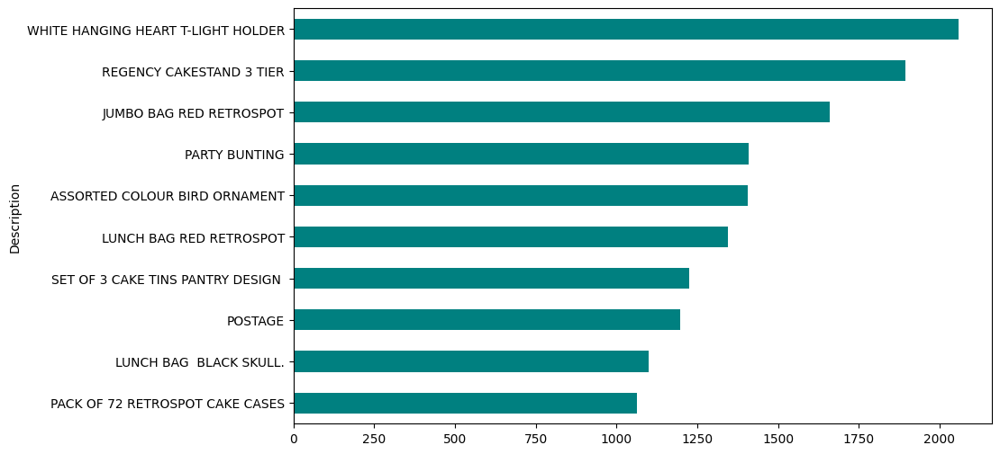

In [886]:
df['Description'].value_counts().head(10).sort_values(ascending=True).plot(kind='barh', color='teal')

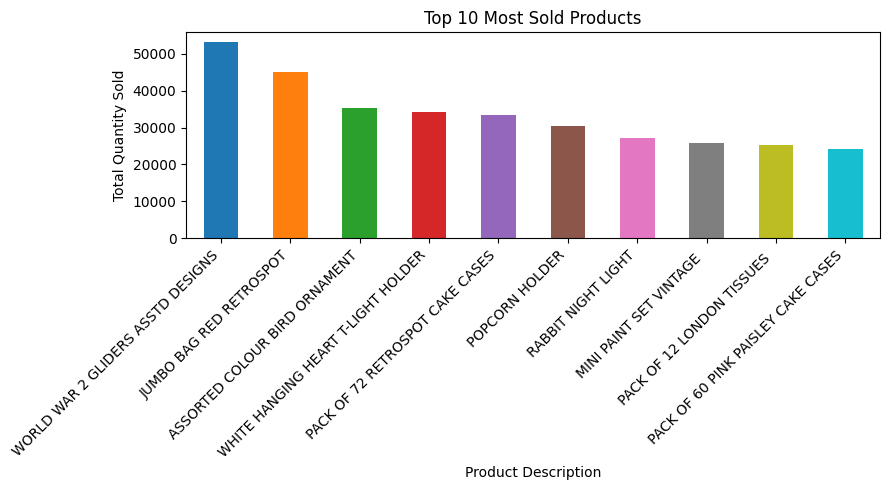

In [887]:
top_products = df.groupby('Description')['Quantity'].sum().nlargest(10)
colors = plt.cm.tab10.colors
plt.figure(figsize=(9, 5))
top_products.plot(kind='bar', color=colors)
plt.title('Top 10 Most Sold Products')
plt.xlabel('Product Description')
plt.ylabel('Total Quantity Sold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Insights**

*   Top Sellers: T-LIGHT HOLDER & RED RETROSPOT BAG are both frequently ordered and sold in high quantities.

*   Party & Decor Focus: Items like CAKE CASES and PARTY BUNTING show strong demand for event-related products.
*   Low-Volume, High-Frequency: Products like REGENCY CAKESTAND are ordered often but in small quantities.
*  Bulk Purchases: Items like GLIDERS and NIGHT LIGHTS are top in volume but not in frequent orders — likely bought in bulk.



### 2. **Most Active Countries:**

<Axes: ylabel='Country'>

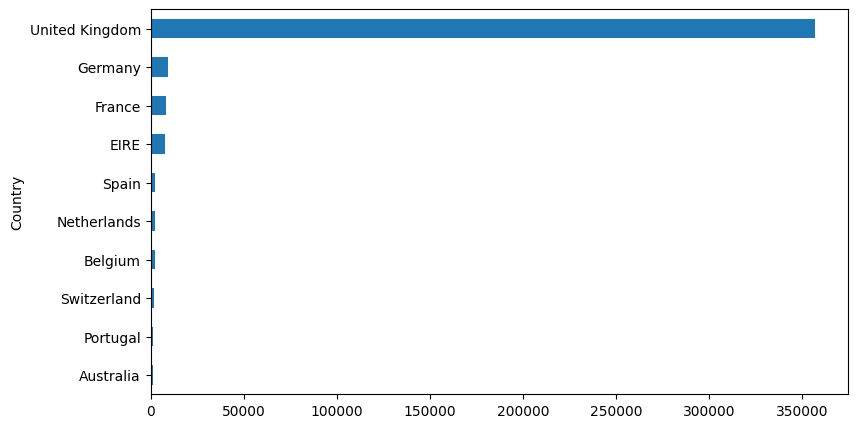

In [888]:
plt.figure(figsize=(9, 5))
df['Country'].value_counts().head(10).sort_values(ascending=True).plot(kind='barh')

**Insights**

*  United Kingdom dominates with the highest sales, far ahead of other countries.

*  Other countries like Germany, France, and EIRE contribute minimal sales.




### 3. **Monthly Sales Trend :**

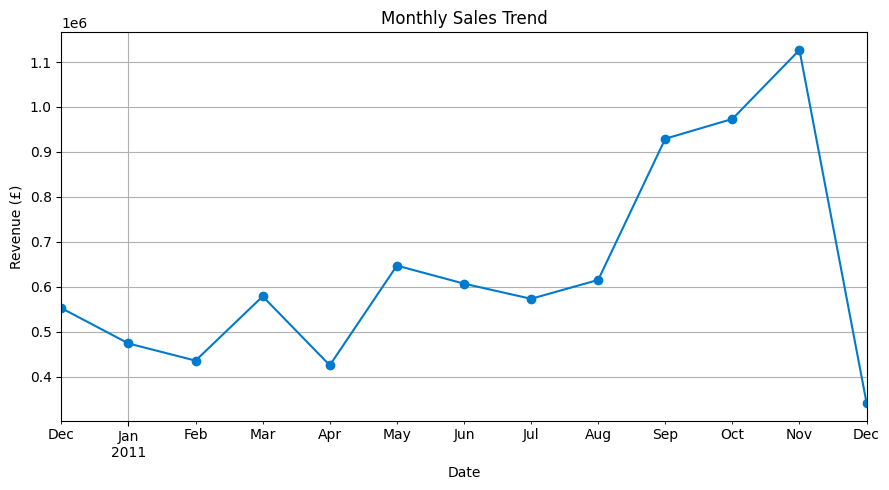

In [889]:
monthly_sales = df.groupby(['Year', 'Month'])['Total Amount Spent'].sum().reset_index()
monthly_sales['Year-Month'] = pd.to_datetime(monthly_sales[['Year', 'Month']].assign(DAY=1))
plt.figure(figsize=(9, 5))
monthly_sales.set_index('Year-Month', inplace=True)
monthly_sales['Total Amount Spent'].plot(kind='line', marker='o', color='#007acc')
plt.title('Monthly Sales Trend')
plt.xlabel('Date')
plt.ylabel('Revenue (£)')
plt.grid(True)
plt.tight_layout()
plt.show()

**Insights**

*   Sales peak in November, indicating a strong pre-holiday season.

*   Lowest revenue seen in April and December (likely partial month data).

### 4. **Sales by Hour (Customer Shopping Behavior) :**

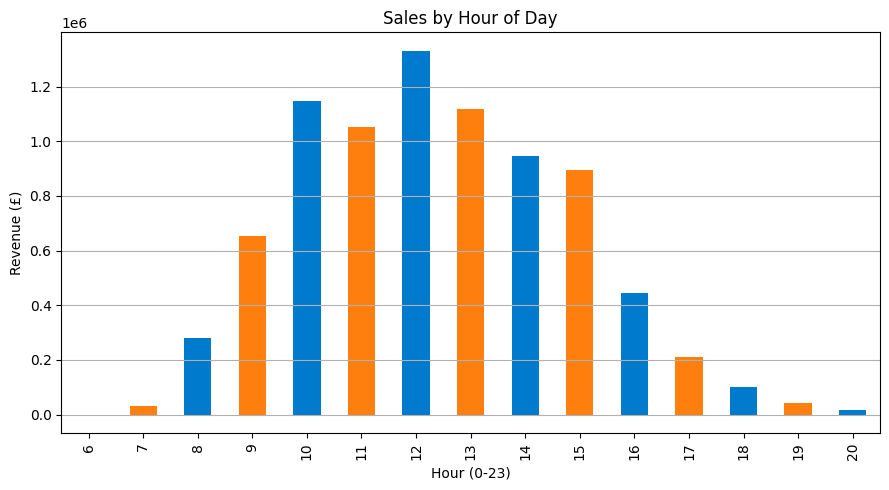

In [890]:
hourly_sales = df.groupby('Hour')['Total Amount Spent'].sum()
colors = ['#007acc', '#ff7f0e']
plt.figure(figsize=(9, 5))
hourly_sales.plot(kind='bar', color=colors)
plt.title('Sales by Hour of Day')
plt.xlabel('Hour (0-23)')
plt.ylabel('Revenue (£)')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

**Insights**

*   Sales are highest between 10 AM to 2 PM.

*   Very few sales happen before 9 AM or after 5 PM.

### 5. **Sales Distribution by Day of Week :**

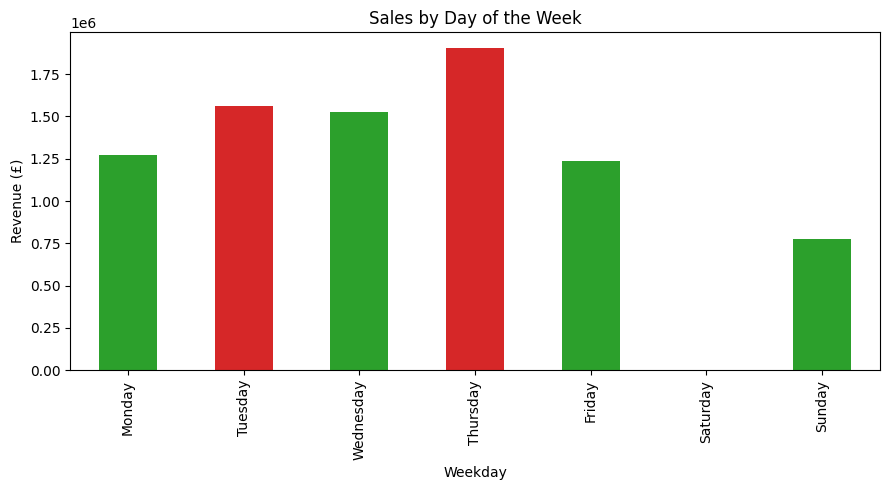

In [891]:
df['Weekday'] = df['InvoiceDate'].dt.day_name()
weekday_sales = df.groupby('Weekday')['Total Amount Spent'].sum().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
colors = ['#2ca02c', '#d62728']
plt.figure(figsize=(9, 5))
weekday_sales.plot(kind='bar', color=colors)
plt.title('Sales by Day of the Week')
plt.xlabel('Weekday')
plt.ylabel('Revenue (£)')
plt.tight_layout()
plt.show()

**Insights**

*  Thursday sees the highest revenue, followed by Tuesday.

*  Weekends, especially Saturday, show the lowest sales activity.


### 6. **Top 10 High-Spending Customers :**

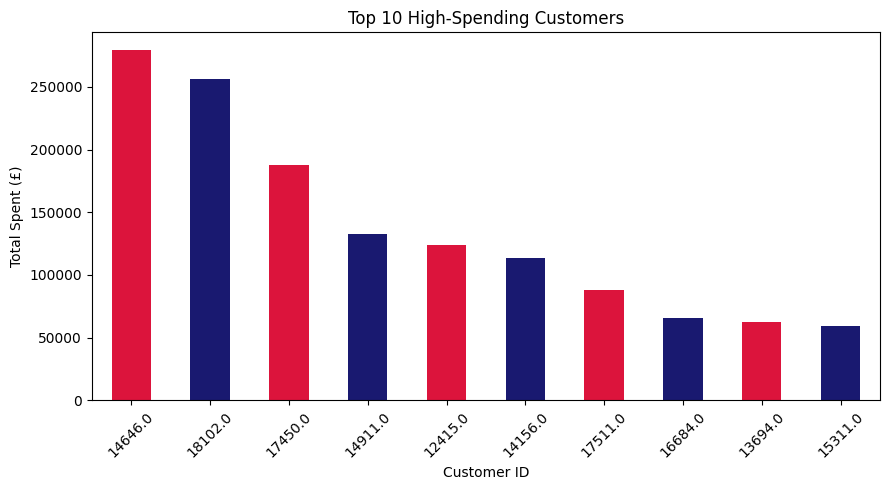

In [892]:
top_customers = df.groupby('CustomerID')['Total Amount Spent'].sum().nlargest(10)
plt.figure(figsize=(9, 5))
top_customers.plot(kind='bar', color=['#DC143C', '#191970'])
plt.title('Top 10 High-Spending Customers')
plt.xlabel('Customer ID')
plt.ylabel('Total Spent (£)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Insights**

*   Customer ID 14646.0 spent the most overall.

*   Spending drops sharply after the top 2 customers.

### 7. **Share of Revenue by Top 5 Countries :**

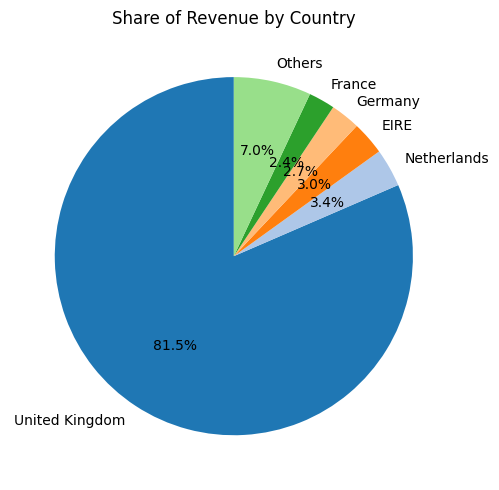

In [893]:
country_revenue = df.groupby('Country')['Total Amount Spent'].sum()
top_5 = country_revenue.nlargest(5)
plt.figure(figsize=(9, 5))
others = country_revenue.sum() - top_5.sum()
top_5['Others'] = others
top_5.plot(kind='pie', autopct='%1.1f%%', colors=plt.cm.tab20.colors, startangle=90)
plt.title('Share of Revenue by Country')
plt.ylabel('')
plt.tight_layout()
plt.show()

**Insights**

*  United Kingdom dominates with 81.5% of total revenue.

*  Netherlands, EIRE, and Germany contribute modestly (3–3.4%).

*   France contributes only 2.4% to total revenue.

*   Others collectively form 7%, indicating minor global reach.

### 8. **Average Spend per Transaction Over Time :**

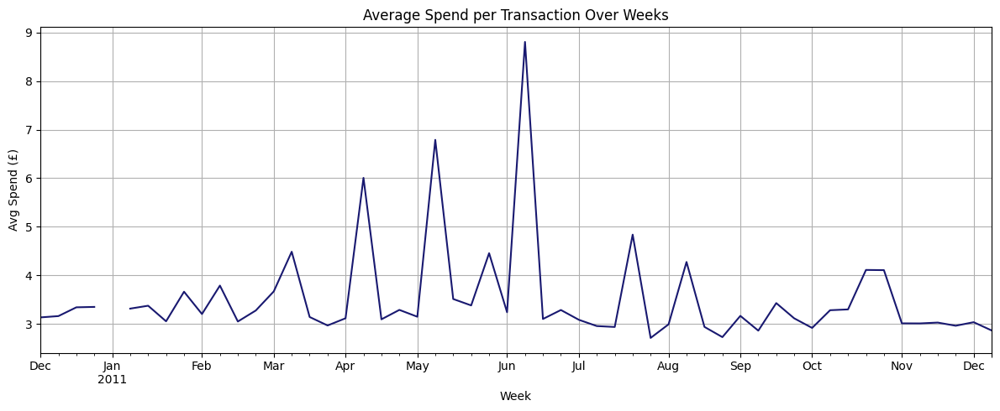

In [894]:
df['AvgSpend'] = df['Total Amount Spent'] / df['Quantity']
avg_spend_trend = df.set_index('InvoiceDate').resample('W')['AvgSpend'].mean()
avg_spend_trend.plot(figsize=(12, 5), color='#191970')
plt.title('Average Spend per Transaction Over Weeks')
plt.xlabel('Week')
plt.ylabel('Avg Spend (£)')
plt.grid(True)
plt.tight_layout()
plt.show()

**Insights**

*  The average spend per transaction generally fluctuates between £3 and £4.

*  There are notable spikes in April, May, and June—particularly in early June, where the average peaks near £9.

*   Spikes may indicate special events, promotions, or seasonal product demand.

### 9. **Cancelled Orders Trend Over Time :**

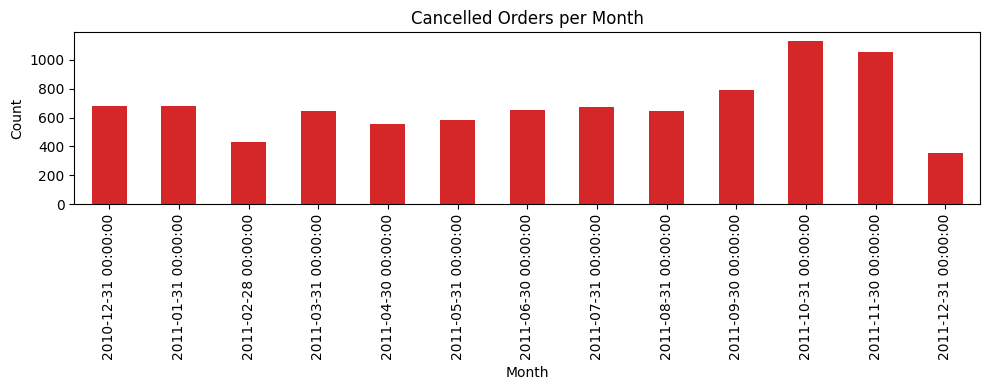

In [895]:
df['Cancelled'] = df['InvoiceNo'].astype(str).str.startswith('C')
cancel_trend = df[df['Cancelled']].set_index('InvoiceDate').resample('M').size()
cancel_trend.plot(kind='bar', color='#d62728', figsize=(10, 4))
plt.title('Cancelled Orders per Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

**Insights**

*  October and November have a sharp increase in cancelled orders, peaking above 1000.

*  February and December have the lowest cancellation rates.

*    High cancellations may coincide with stockouts, delivery delays, or post-promotion effects.

### 10. **Days Between Customer Purchases (Interpurchase Time) :**

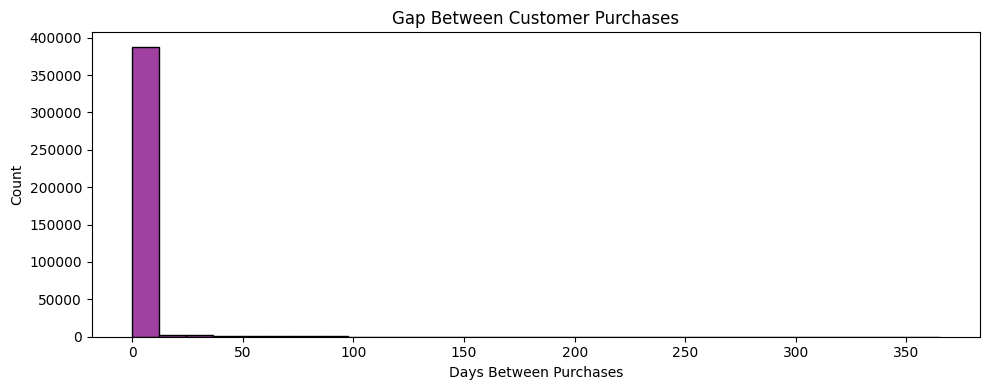

In [896]:
df_sorted = df.sort_values(['CustomerID', 'InvoiceDate'])
df_sorted['PrevDate'] = df_sorted.groupby('CustomerID')['InvoiceDate'].shift(1)
df_sorted['DaysBetween'] = (df_sorted['InvoiceDate'] - df_sorted['PrevDate']).dt.days
plt.figure(figsize=(10, 4))
sns.histplot(df_sorted['DaysBetween'].dropna(), bins=30, color='purple')
plt.title('Gap Between Customer Purchases')
plt.xlabel('Days Between Purchases')
plt.tight_layout()
plt.show()

**Insights**

* The vast majority of customers repurchase within 0–10 days.

*  February and December have the lowest cancellation rates.

*  Suggests strong short-term retention or bulk ordering behavior.

### 11. **Monthly Sales Trend of Top Product :**

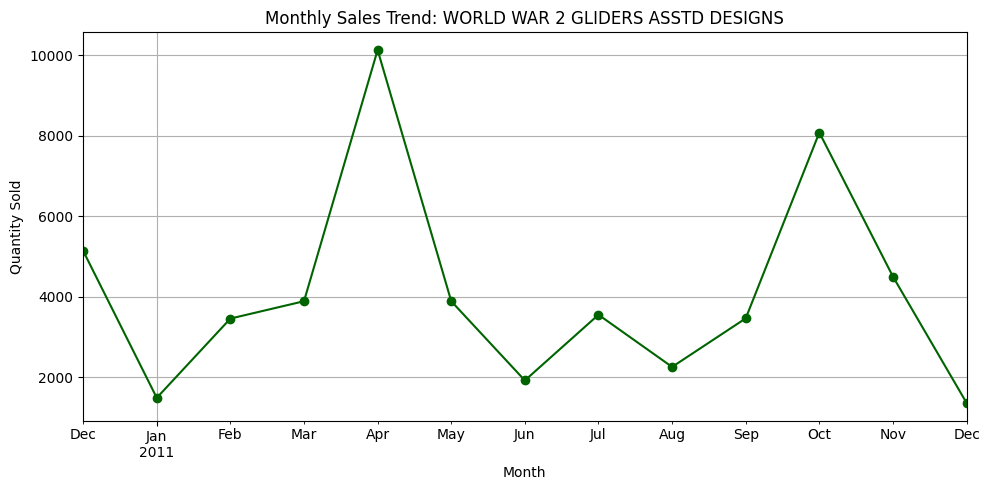

In [897]:
top_products_qty = df.groupby('Description')['Quantity'].sum().sort_values(ascending=False).head(10)
top_product = top_products_qty.index[0]
df_top = df[df['Description'] == top_product]
monthly_top_product = df_top.set_index('InvoiceDate').resample('M')['Quantity'].sum()
plt.figure(figsize=(10,5))
monthly_top_product.plot(marker='o', color='darkgreen')
plt.title(f'Monthly Sales Trend: {top_product}')
plt.xlabel('Month')
plt.ylabel('Quantity Sold')
plt.grid(True)
plt.tight_layout()
plt.show()

**Insights**

* April and October are peak sales months, with April surpassing 10,000 units.

* January and December are lowest in sales.

*  Opportunities exist to scale marketing during off-peak months to even out sales.

### 12. **Word Cloud of Most Frequent Products**

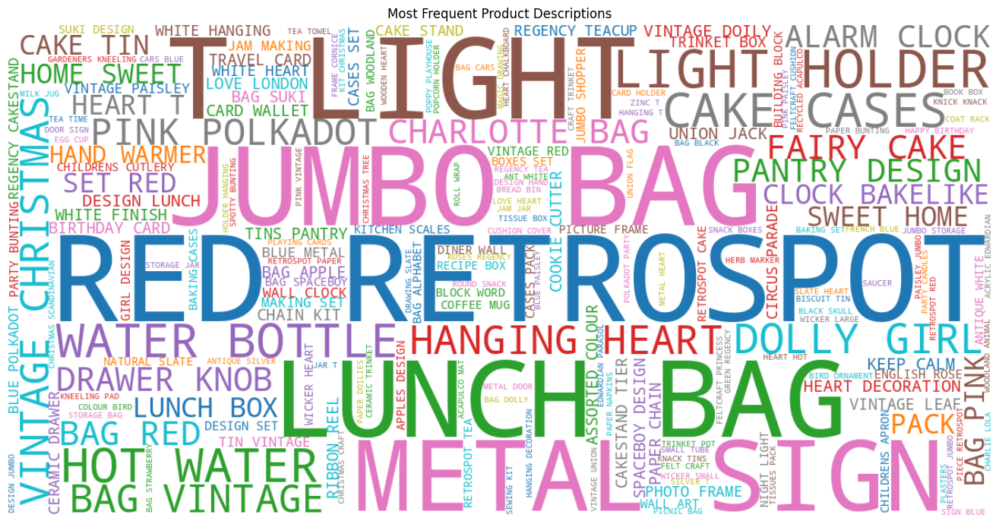

In [898]:
from wordcloud import WordCloud
product_text = ' '.join(df['Description'].dropna().astype(str))
wordcloud = WordCloud(width=1200, height=600, background_color='white', colormap='tab10').generate(product_text)
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Frequent Product Descriptions')
plt.tight_layout()
plt.show()

**Insights**

* "LUNCH BAG", "RED", "RETRO", "SPOT", and "JUMBO" are very prominent—indicating popular product themes.

* Strong focus on bag types, vintage/retro styles, and home decor items.

* Color and pattern (e.g. "RED", "POLKADOT") appear to be important to customers.

### 13. **Top 10 Most Returned Products**

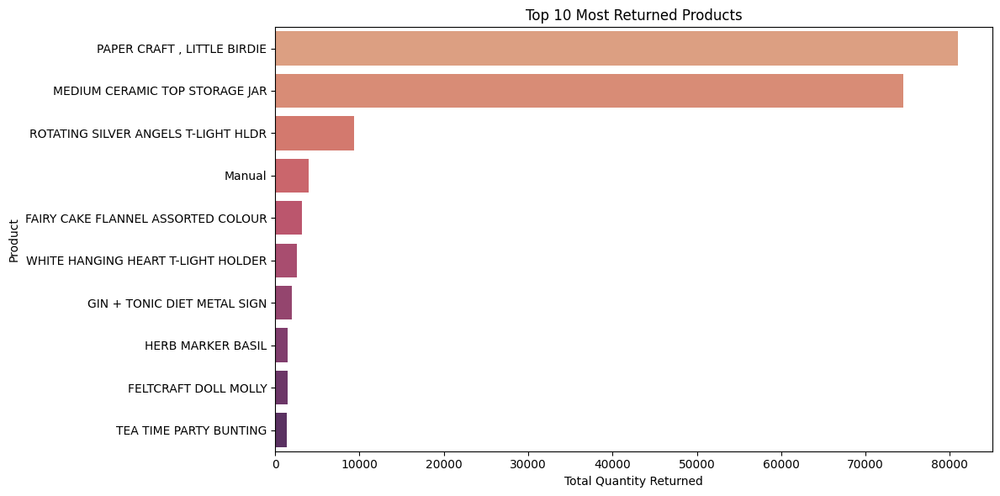

In [899]:
returns_df = df[df['Quantity'] < 0]
# Group by description and sum negative quantities
top_returns = returns_df.groupby('Description')['Quantity'].sum().abs().sort_values(ascending=False).head(10)
plt.figure(figsize=(12,6))
sns.barplot(x=top_returns.values, y=top_returns.index, palette='flare')
plt.title('Top 10 Most Returned Products')
plt.xlabel('Total Quantity Returned')
plt.ylabel('Product')
plt.tight_layout()
plt.show()

**Insights**

* “PAPER CRAFT, LITTLE BIRDIE” and “MEDIUM CERAMIC TOP STORAGE JAR” have extremely high return rates.

* Strong focus on bag types, vintage/retro styles, and home decor items.

* Color and pattern (e.g. "RED", "POLKADOT") appear to be important to customers.

### 14. **Word Cloud of most frequent countries**

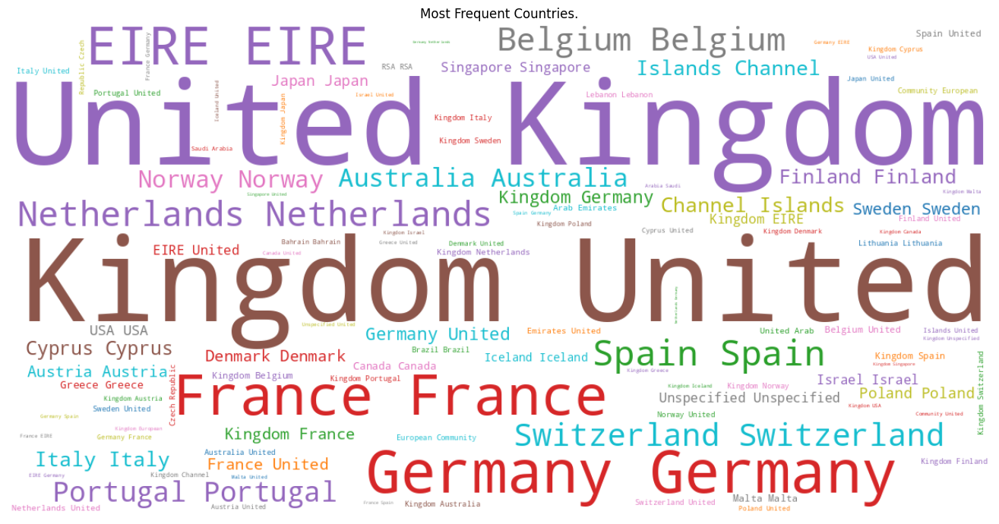

In [900]:
country_text = ' '.join(df['Country'].dropna().astype(str))
wordcloud = WordCloud(width=1200, height=600, background_color='white', colormap='tab10').generate(country_text)
plt.figure(figsize=(15,7))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Frequent Countries.')
plt.tight_layout()
plt.show()

**Insights**

* The United Kingdom is the dominant customer base.

* Germany, France, EIRE (Ireland), Netherlands, and Spain are also significant markets.

* Strong presence in Western Europe—could suggest regional marketing focus.

### 15. **Correlation Heatmap of Numerical Features**

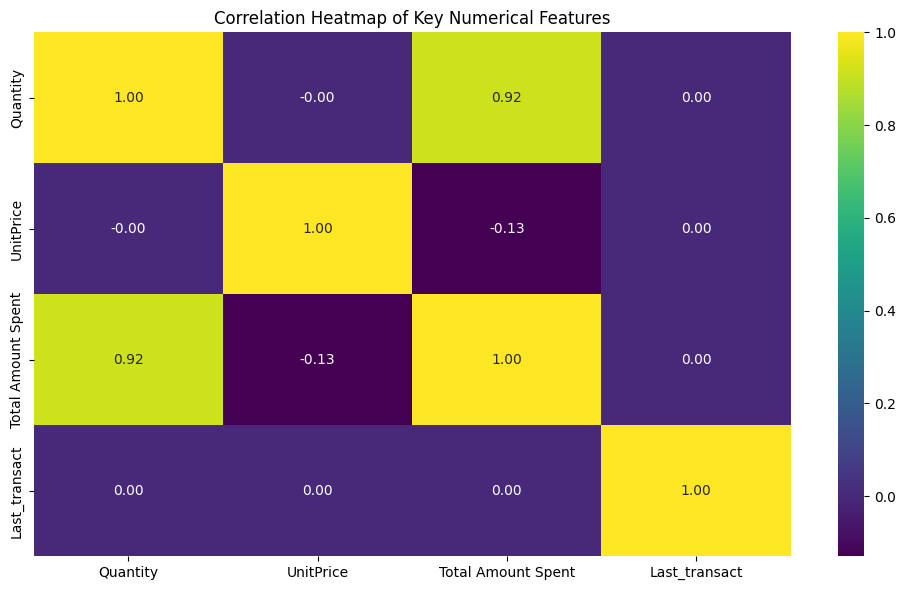

In [901]:
plt.figure(figsize=(10, 6))
sns.heatmap(df[['Quantity', 'UnitPrice', 'Total Amount Spent', 'Last_transact']].corr(),
            annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heatmap of Key Numerical Features')
plt.tight_layout()
plt.show()

**Insights**

* Quantity and Total Amount Spent have a very strong positive correlation (0.92).

* Unit Price is weakly negatively correlated with Total Amount Spent (-0.13), suggesting lower-priced items dominate total revenue.

*  Pricing strategies may benefit more from volume rather than unit price increases.

### 16. **Pair Plot**

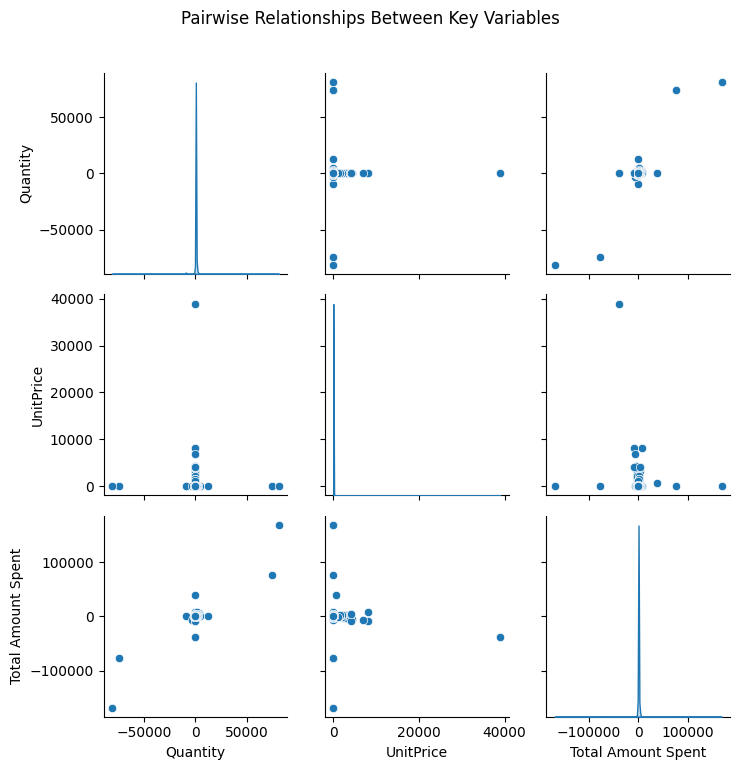

In [902]:
sns.pairplot(df[['Quantity', 'UnitPrice', 'Total Amount Spent']], diag_kind='kde', palette='husl')
plt.suptitle("Pairwise Relationships Between Key Variables", y=1.02)
plt.tight_layout()
plt.show()

**Insights**

* Clear positive linear trend between Quantity and Total Amount Spent.

* No strong pattern between Unit Price and Total Amount Spent—revenue is volume-driven.

* Extreme outliers are present, possibly indicating bulk buyers or data entry anomalies.

# ***4. Feature Engineering & Data Pre-processing***

## **Feature Engineering**

In [903]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Month', 'Day', 'Hour',
       'Total Amount Spent', 'Last_transact', 'Weekday', 'AvgSpend',
       'Cancelled'],
      dtype='object')

In [904]:
df = df.drop(columns=['Day', 'Weekday','Hour', 'AvgSpend', 'Cancelled'])

In [905]:
# We will add all categorical and text based columns
df['text_info'] = df['Description']+ ' '+ df['Country']

In [906]:
# Checking
df['text_info'][0]

'WHITE HANGING HEART T-LIGHT HOLDER United Kingdom'

### **Handling Outliers**

In [907]:
columns = ['Quantity', 'UnitPrice', 'Total Amount Spent', 'Last_transact']
# let's create a function to check the outliers
def check_outliers(columns,df):
  for i in columns:
    fig = px.box(df,y=i)
    fig.update_layout(height=500, width=600)
    fig.show()

# Plot the graph
check_outliers(columns,df)

In [908]:
def cap_outliers_iqr(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR

        df[col] = np.where(df[col] < lower_limit, lower_limit, df[col])
        df[col] = np.where(df[col] > upper_limit, upper_limit, df[col])
    return df
df = cap_outliers_iqr(df, columns)

###  **Text cleaning**

In [909]:
# Removes non-alphabetic characters (keeps only letters and spaces)
import re
def clean_text(x):
    return re.sub(r"[^a-zA-Z ]", "", str(x))

# Apply the cleaning and lowercase it
df['text_info'] = df['text_info'].apply(clean_text)
df['text_info'] = df['text_info'].str.lower()

In [910]:
#necessary import for nlp
import nltk
nltk.download('punkt_tab')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
nltk.download('punkt')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### **Stemming-**

In [911]:
# Initialize stemmer and stopwords
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

# Function to clean text
def filter_words(text):
    tokens = word_tokenize(text)
    filtered = [stemmer.stem(word) for word in tokens if word not in stop_words]
    return " ".join(filtered)  # return as string

# Apply to column
df['cleaned_text'] = df['text_info'].apply(filter_words)

In [912]:
words = df.cleaned_text
words

,cleaned_text
0,white hang heart tlight holder unit kingdom
1,white metal lantern unit kingdom
2,cream cupid heart coat hanger unit kingdom
3,knit union flag hot water bottl unit kingdom
4,red woolli hotti white heart unit kingdom
...,...
541904,pack spaceboy napkin franc
541905,children apron dolli girl franc
541906,children cutleri dolli girl franc
541907,children cutleri circus parad franc


### **Using TF-IDF**

In [913]:
t_vectorizer = TfidfVectorizer(max_df = 0.9,min_df = 1, max_features=15000)
X = t_vectorizer.fit_transform(words)

In [914]:
X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 2353608 stored elements and shape (401604, 1814)>

### **Applying TruncatedSVD to reduce dimensions.**

In [915]:
from sklearn.decomposition import TruncatedSVD
# Use X from your TF-IDF vectorizer
svd = TruncatedSVD(n_components=50, random_state=42)
X_reduced = svd.fit_transform(X)

### **Cumulative Explained Variance**

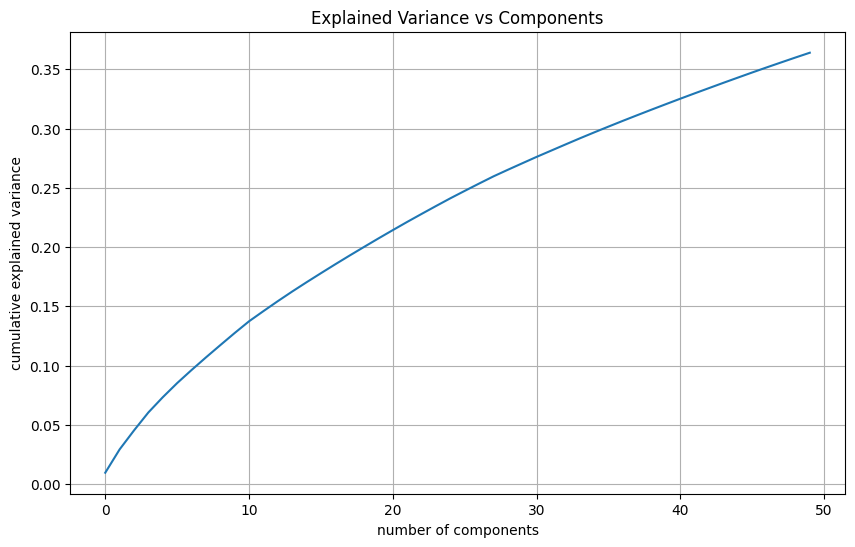

In [916]:
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(svd.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Explained Variance vs Components')
plt.grid(True)
plt.show()

In [917]:
transformer = TruncatedSVD(n_components=20, random_state=42)
transformer.fit(X)
X_transformed = transformer.transform(X)
X_transformed.shape

(401604, 20)

In [918]:
# Vectorizing
X_vectorized = t_vectorizer.transform(words)
# Applying TruncatedSVD
X = transformer.transform(X_vectorized)

In [919]:
X

array([[ 0.30870772, -0.54882065, -0.49032958, ..., -0.12062932,
        -0.03531397, -0.02084671],
       [ 0.18494691, -0.15794257, -0.07646623, ..., -0.12787254,
        -0.09545492, -0.0622701 ],
       [ 0.12626857, -0.13234245, -0.07439201, ...,  0.02802213,
        -0.00366862,  0.00682888],
       ...,
       [ 0.07221816,  0.0334479 ,  0.03215315, ...,  0.19298222,
        -0.37650437, -0.05082555],
       [ 0.04136545,  0.00850174,  0.03593349, ...,  0.06877587,
        -0.13843275, -0.03301649],
       [ 0.15997357, -0.0020159 ,  0.2662906 , ...,  0.06153865,
        -0.0668387 ,  0.06726637]])

## ***5. Cluster Model Implementation***

### **Silhouette Score Elbow for KMeans Clustering**

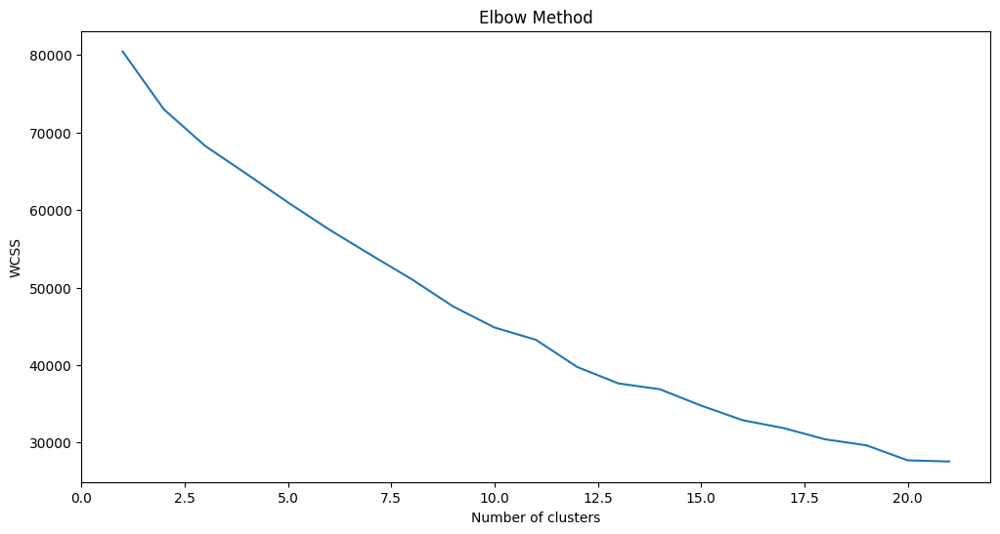

In [920]:
# We will plot the graph to get the no. of clusters
wcss = []
for i in range(1, 22):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))
plt.plot(range(1, 22), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()



*   We will take n = 13.



### **Dendogram**

In [921]:
from sklearn.utils import resample
X_sampled = resample(X_reduced, n_samples=7000, random_state=42)

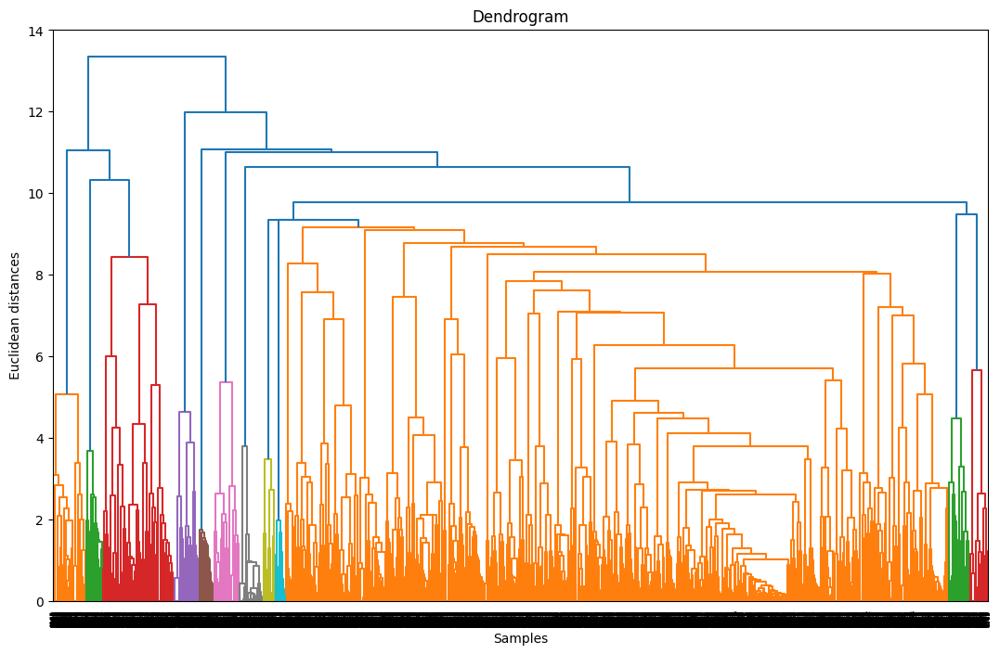

In [922]:
# Plot the dendogram
plt.figure(figsize=(13, 8))
dendrogram = sch.dendrogram(sch.linkage(X_sampled, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Euclidean distances')
plt.show()
#check for largest distance vertically without crossing any horizontal line

### **Agglomerative Clustering**

In [923]:
# Let's  import AgglomerativeClustering
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 13, linkage = 'ward')
y_hc = hc.fit_predict(X_sampled)

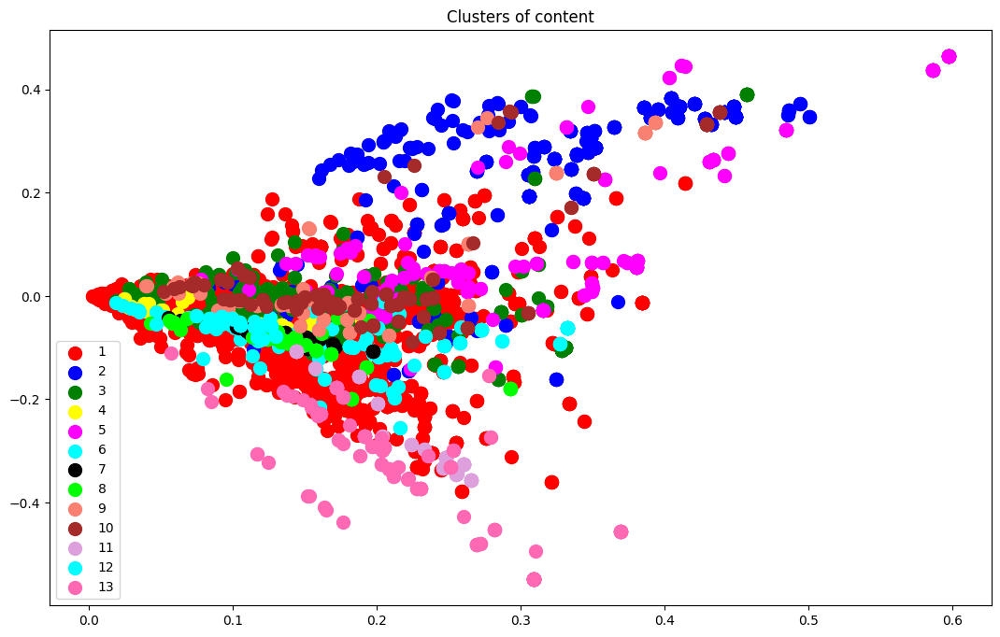

In [924]:
# Visualizing the clusters (three dimensions only)
plt.figure(figsize=(13,8))
plt.scatter(X_sampled[y_hc == 0, 0], X_sampled[y_hc == 0, 1], s = 100, c = 'red', label = '1')
plt.scatter(X_sampled[y_hc == 1, 0], X_sampled[y_hc == 1, 1], s = 100, c = 'blue', label = '2')
plt.scatter(X_sampled[y_hc == 2, 0], X_sampled[y_hc == 2, 1], s = 100, c = 'green', label = '3')
plt.scatter(X_sampled[y_hc == 3, 0], X_sampled[y_hc == 3, 1], s = 100, c = 'yellow', label = '4')
plt.scatter(X_sampled[y_hc == 4, 0], X_sampled[y_hc == 4, 1], s = 100, c = 'magenta', label = '5')
plt.scatter(X_sampled[y_hc == 5, 0], X_sampled[y_hc == 5, 1], s = 100, c = 'cyan', label = '6')
plt.scatter(X_sampled[y_hc == 6, 0], X_sampled[y_hc == 6, 1], s = 100, c = 'black', label = '7')
plt.scatter(X_sampled[y_hc == 7, 0], X_sampled[y_hc == 7, 1], s = 100, c = 'lime', label = '8')
plt.scatter(X_sampled[y_hc == 8, 0], X_sampled[y_hc == 8, 1], s = 100, c = 'salmon', label = '9')
plt.scatter(X_sampled[y_hc == 9, 0], X_sampled[y_hc == 9, 1], s = 100, c = 'brown', label = '10')
plt.scatter(X_sampled[y_hc == 10, 0], X_sampled[y_hc == 10, 1], s = 100, c = 'plum', label = '11')
plt.scatter(X_sampled[y_hc == 11, 0], X_sampled[y_hc == 11, 1], s = 100, c = 'aqua', label = '12')
plt.scatter(X_sampled[y_hc == 12, 0], X_sampled[y_hc == 12, 1], s = 100, c = 'hotpink', label = '13')
plt.title('Clusters of content')
plt.legend()
plt.show()

In [925]:
# Check Silhouette Score for each cluster
from sklearn.cluster import AgglomerativeClustering
silhouette_score_ = [  ]
range_n_clusters = [i for i in range(2,16)]
for n_clusters in range_n_clusters:
    clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    preds = clusterer.fit_predict(X_sampled)
    #centers = clusterer.cluster_centers_

    score = silhouette_score(X_sampled, preds)
    silhouette_score_.append([int(n_clusters) , round(score , 3)])
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.1303304130704512
For n_clusters = 3, silhouette score is 0.13618590205597647
For n_clusters = 4, silhouette score is 0.14541985590846315
For n_clusters = 5, silhouette score is 0.1426900066322482
For n_clusters = 6, silhouette score is 0.14812396793422405
For n_clusters = 7, silhouette score is 0.10840175818285158
For n_clusters = 8, silhouette score is 0.11638394897345866
For n_clusters = 9, silhouette score is 0.12481135333169009
For n_clusters = 10, silhouette score is 0.132989055307237
For n_clusters = 11, silhouette score is 0.13919109142263933
For n_clusters = 12, silhouette score is 0.14800212482898295
For n_clusters = 13, silhouette score is 0.14883421173399666
For n_clusters = 14, silhouette score is 0.12852145047791413
For n_clusters = 15, silhouette score is 0.13448291989909614


### **KMeans Clustering**

#### **Model fitting**

In [926]:
# fitting the k means algorithm on lower features
kmeans= KMeans(n_clusters=13, init= 'k-means++',max_iter=300, n_init=1)
kmeans.fit(X_sampled)

KMeans(n_clusters=13, n_init=1)

In [927]:
# Calculating score
from sklearn.metrics import silhouette_score
print("Silhouette Coefficient:  %0.3f"%silhouette_score(X_sampled, kmeans.labels_))

Silhouette Coefficient:  0.137


**Predicting**

In [928]:
#predict the labels of clusters.
label = kmeans.fit_predict(X_sampled)

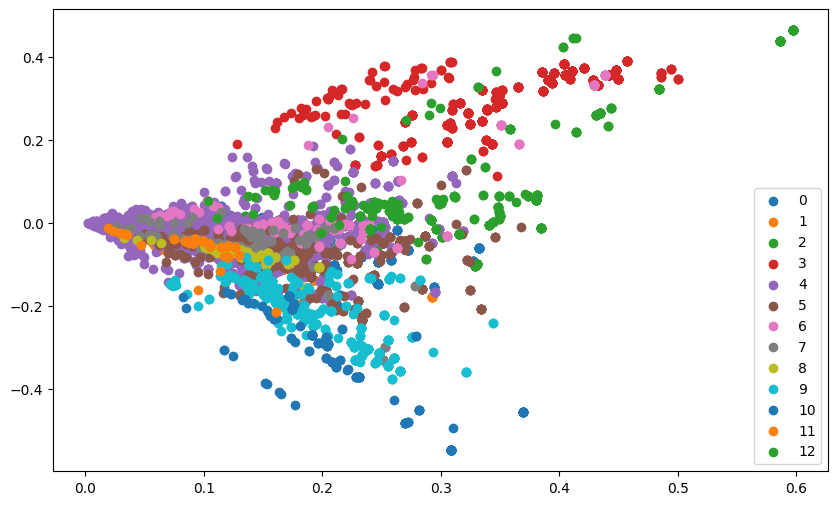

In [929]:
#Getting unique labels
u_labels = np.unique(label)
#plotting the results:
for i in u_labels:
    plt.scatter(X_sampled[label == i , 0] , X_sampled[label == i , 1] , label = i)
plt.rcParams["figure.figsize"] = (20,8)
plt.legend()
plt.show()

**Assigning clusters in our dataset by creating a new column "clusters"**

In [930]:
# Resample df to match X_sampled
df_sampled = resample(df, n_samples=X_sampled.shape[0], random_state=42)
df_sampled['clusters'] = kmeans.labels_

In [931]:
df_sampled.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Total Amount Spent,Last_transact,text_info,cleaned_text,clusters
175748,551983,23076,ICE CREAM SUNDAE LIP GLOSS,24.0,2011-05-05 14:32:00,1.25,17735.0,United Kingdom,2011,5,30.0,217.0,ice cream sundae lip gloss united kingdom,ice cream sunda lip gloss unit kingdom,4
208199,555106,22697,GREEN REGENCY TEACUP AND SAUCER,6.0,2011-05-31 14:14:00,2.95,12790.0,Netherlands,2011,5,17.7,191.0,green regency teacup and saucer netherlands,green regenc teacup saucer netherland,4
189554,553158,22090,PAPER BUNTING RETROSPOT,6.0,2011-05-13 15:24:00,2.95,14194.0,United Kingdom,2011,5,17.7,209.0,paper bunting retrospot united kingdom,paper bunt retrospot unit kingdom,12
490115,578040,22558,CLOTHES PEGS RETROSPOT PACK 24,4.0,2011-11-22 14:21:00,1.65,13322.0,United Kingdom,2011,11,6.6,16.0,clothes pegs retrospot pack united kingdom,cloth peg retrospot pack unit kingdom,0
357627,568101,84988,SET OF 72 PINK HEART PAPER DOILIES,12.0,2011-09-23 15:21:00,1.45,15978.0,United Kingdom,2011,9,17.4,76.0,set of pink heart paper doilies united kingdom,set pink heart paper doili unit kingdom,5


# ***5. Analysing all clusters***

In [932]:
#word cloud imports
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [933]:
#word cloud for user rating review
def word_count(category):
  print("Exploring Cluster", category)
  col_names = ['Description', 'Country']
  for i in col_names:
    df_word_cloud = df_sampled[['clusters',i]].dropna()
    df_word_cloud = df_word_cloud[df_word_cloud['clusters']==category]
    text = " ".join(word for word in df_word_cloud[i])
    # Create stopword list:
    stopwords = set(STOPWORDS)
  # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  # Display the generated image:
  # the matplotlib way:
    plt.rcParams["figure.figsize"] = (10,6)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")

    print("Looking for insights from", i)
    plt.show()

##### **Analysis of cluster 0:-**

Exploring Cluster 0
Looking for insights from Description


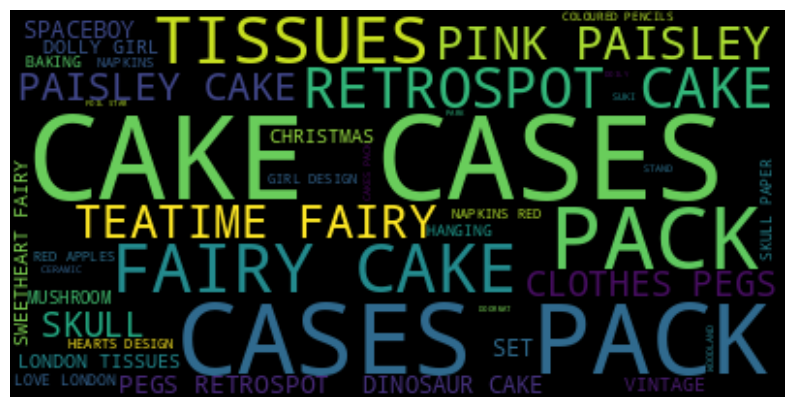

Looking for insights from Country


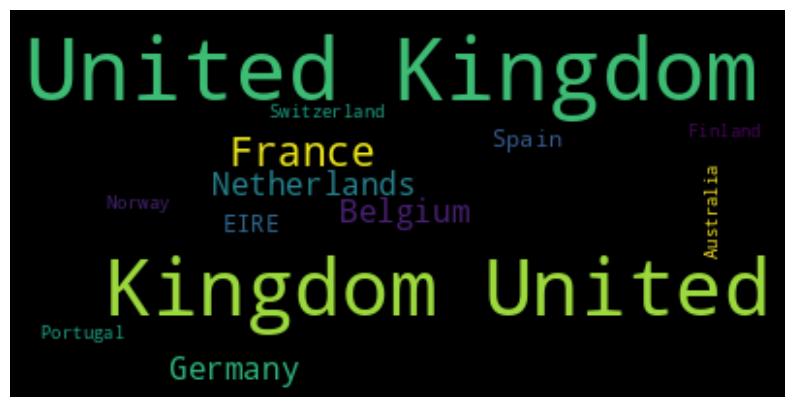

In [934]:
#Analysis of cluster 0
word_count(0)

##### **Analysis of cluster 1:-**

Exploring Cluster 1
Looking for insights from Description


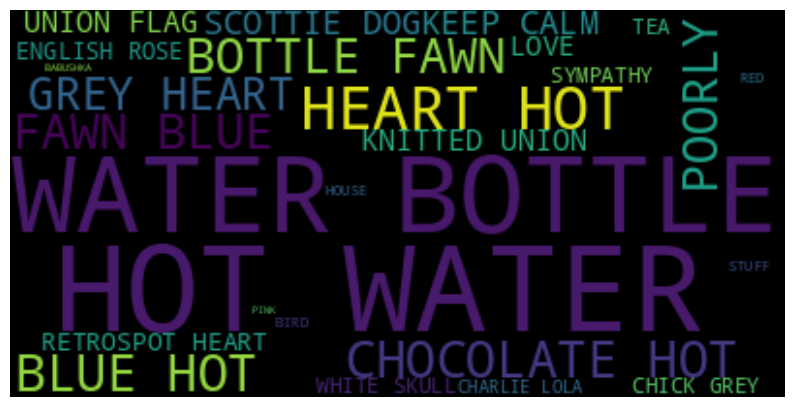

Looking for insights from Country


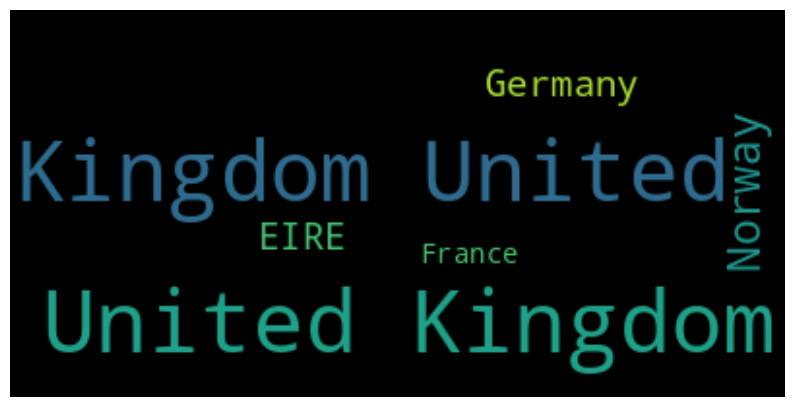

In [935]:
#Analysis of cluster 1
word_count(1)

##### **Analysis of cluster 2:-**

Exploring Cluster 2
Looking for insights from Description


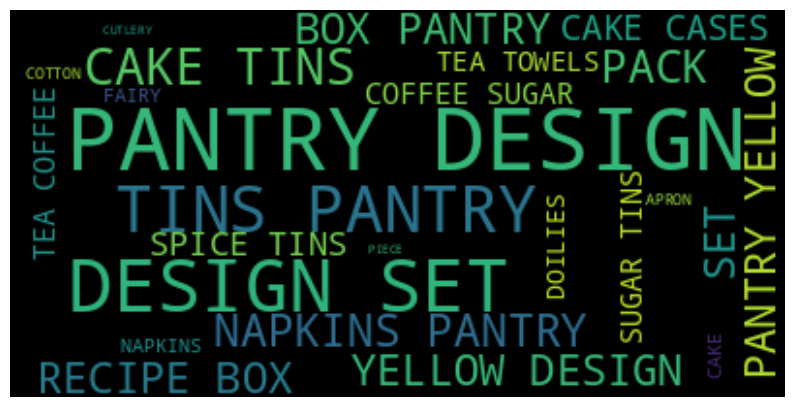

Looking for insights from Country


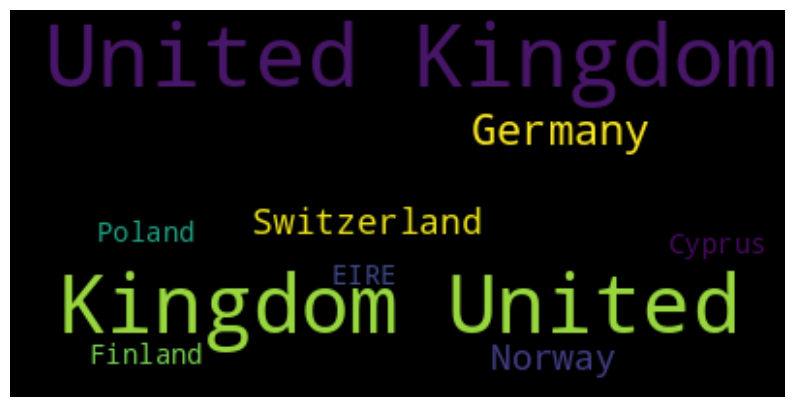

In [936]:
#Analysis of cluster 2
word_count(2)

##### **Analysis of cluster 3:-**

Exploring Cluster 3
Looking for insights from Description


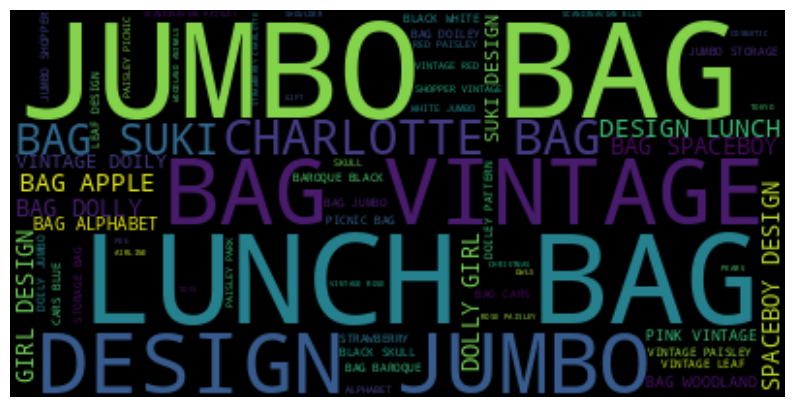

Looking for insights from Country


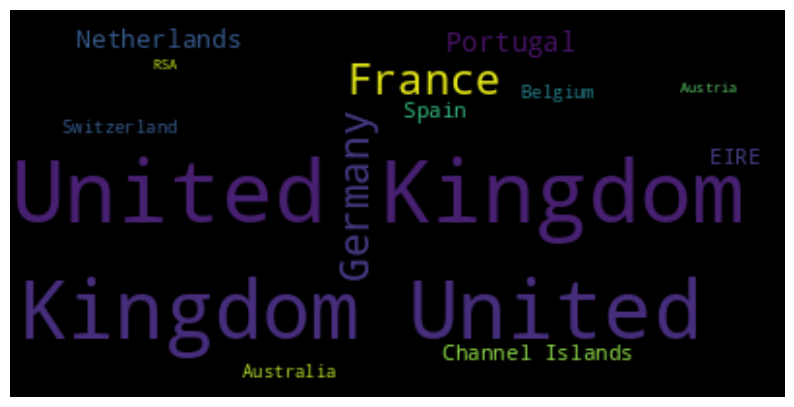

In [937]:
#Analysis of cluster 3
word_count(3)

##### **Analysis of cluster 4:-**

Exploring Cluster 4
Looking for insights from Description


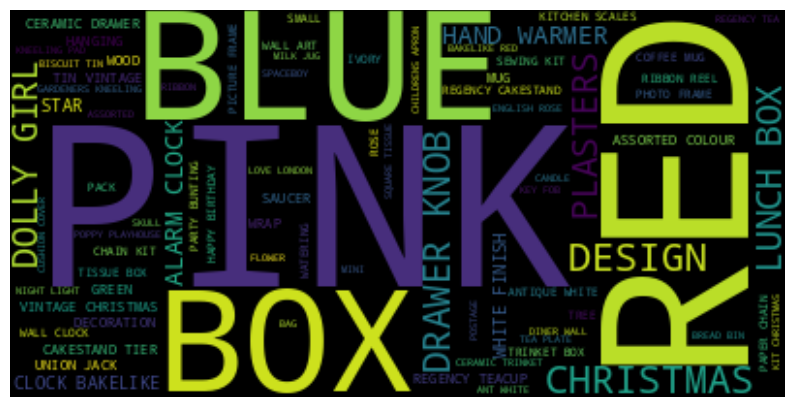

Looking for insights from Country


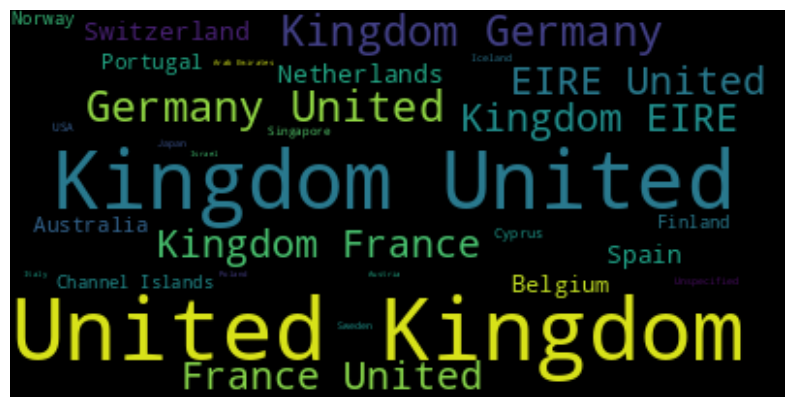

In [938]:
#Analysis of cluster 4
word_count(4)

##### **Analysis of cluster 5:-**

Exploring Cluster 5
Looking for insights from Description


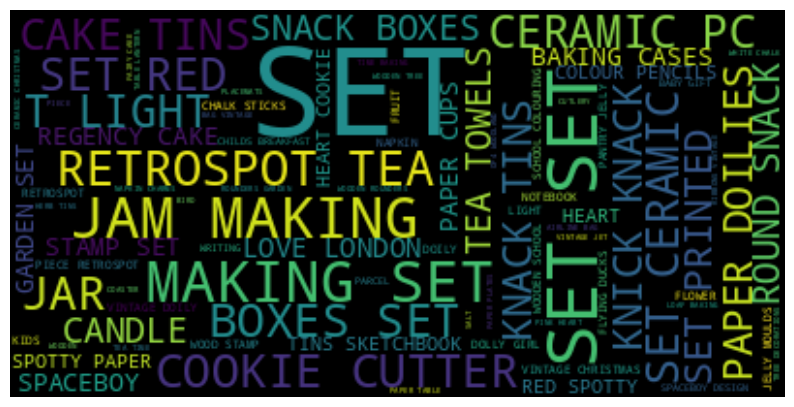

Looking for insights from Country


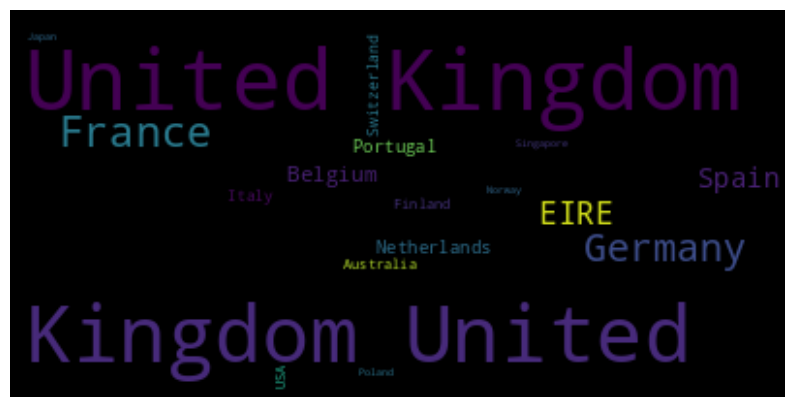

In [939]:
#Analysis of cluster 5
word_count(5)

##### **Analysis of cluster 6:-**

Exploring Cluster 6
Looking for insights from Description


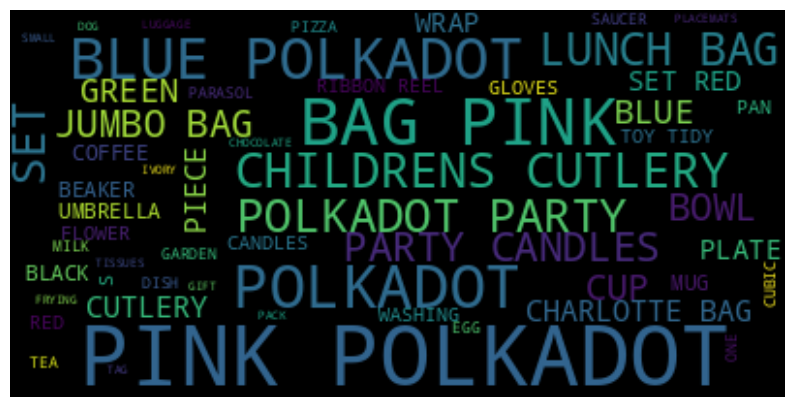

Looking for insights from Country


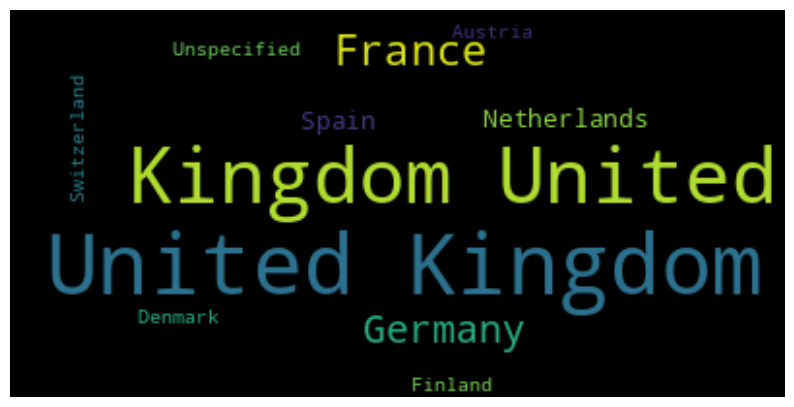

In [940]:
#Analysis of cluster 6
word_count(6)

##### **Analysis of cluster 7:-**

Exploring Cluster 7
Looking for insights from Description


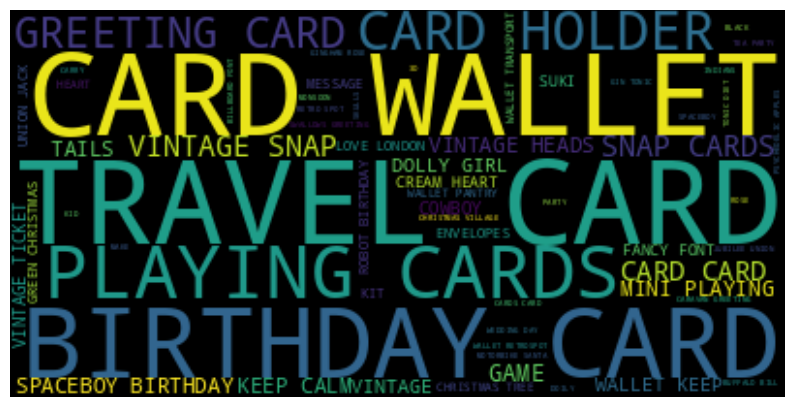

Looking for insights from Country


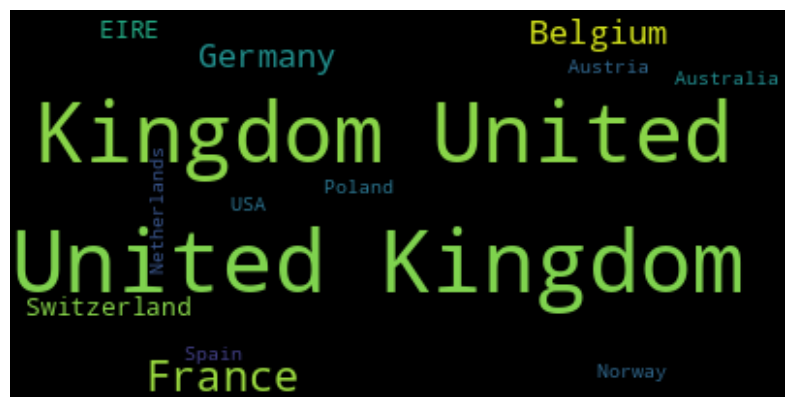

In [941]:
#Analysis of cluster 7
word_count(7)

##### **Analysis of cluster 8:-**

Exploring Cluster 8
Looking for insights from Description


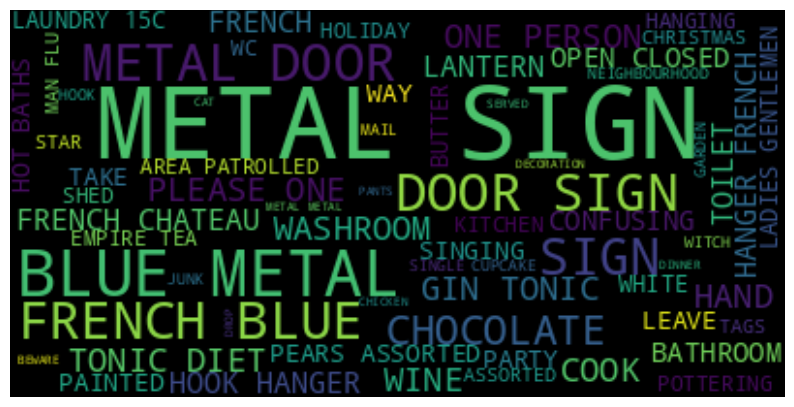

Looking for insights from Country


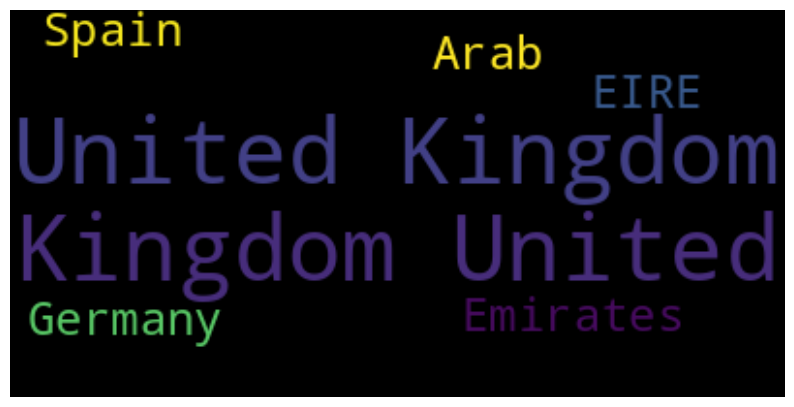

In [942]:
#Analysis of cluster 8
word_count(8)

##### **Analysis of cluster 9:-**

Exploring Cluster 9
Looking for insights from Description


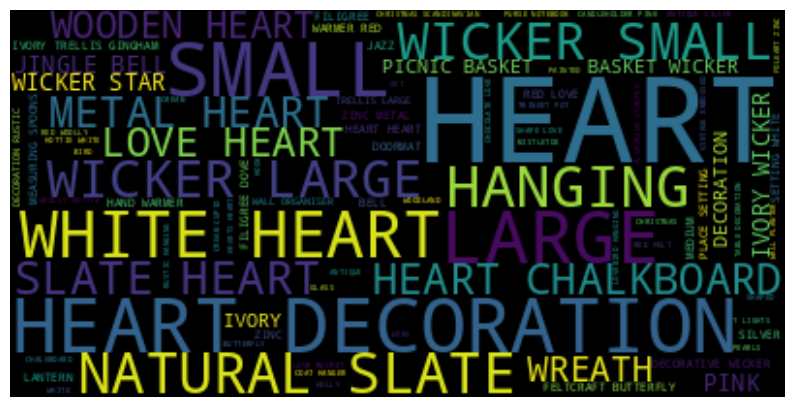

Looking for insights from Country


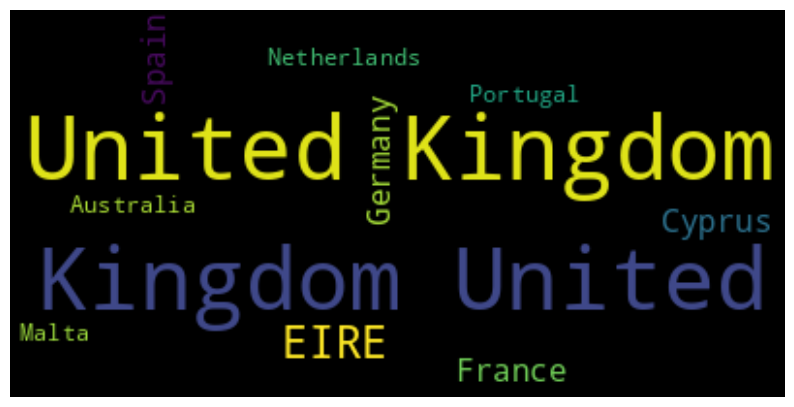

In [943]:
#Analysis of cluster 9
word_count(9)

##### **Analysis of cluster 10:-**

Exploring Cluster 10
Looking for insights from Description


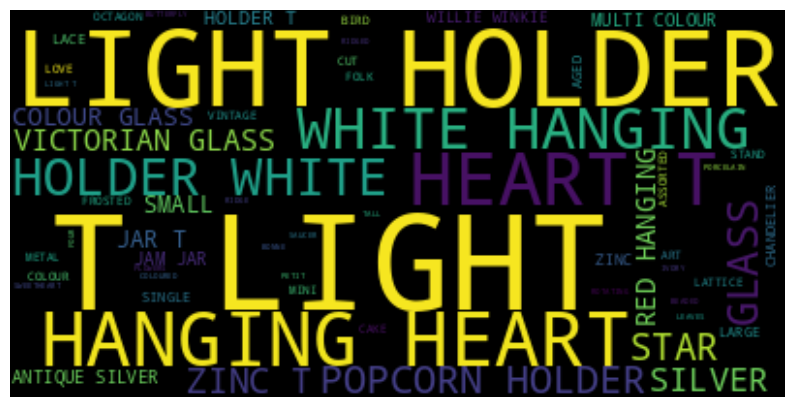

Looking for insights from Country


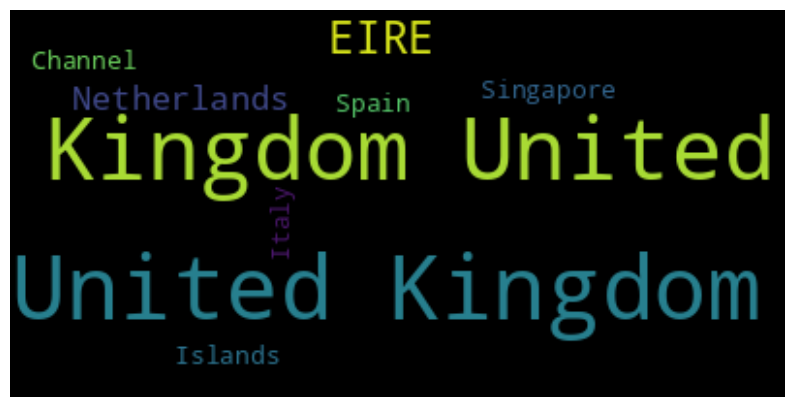

In [944]:
#Analysis of cluster 10
word_count(10)

##### **Analysis of cluster 11:-**

Exploring Cluster 11
Looking for insights from Description


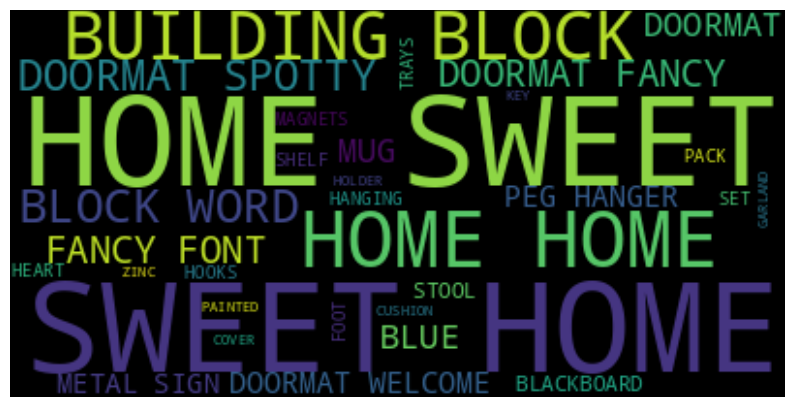

Looking for insights from Country


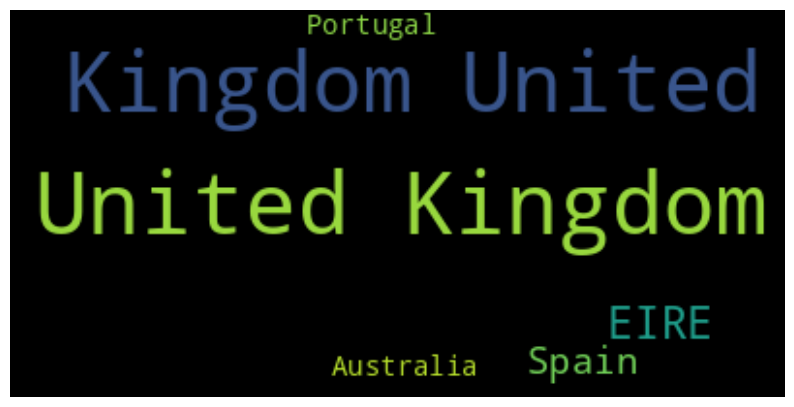

In [945]:
#Analysis of cluster 11
word_count(11)

##### **Analysis of cluster 12:-**

Exploring Cluster 12
Looking for insights from Description


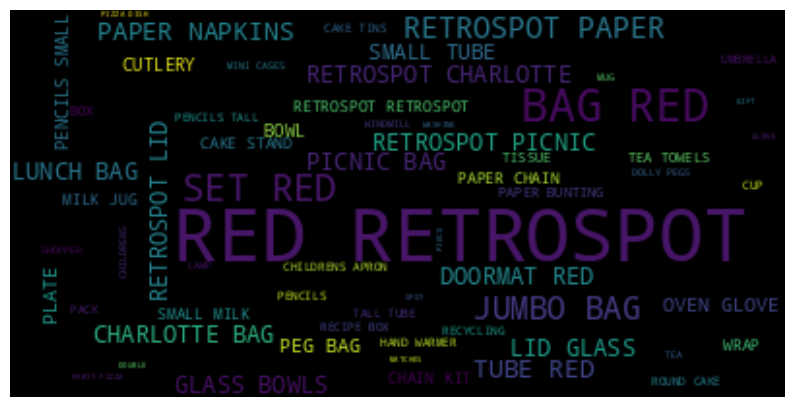

Looking for insights from Country


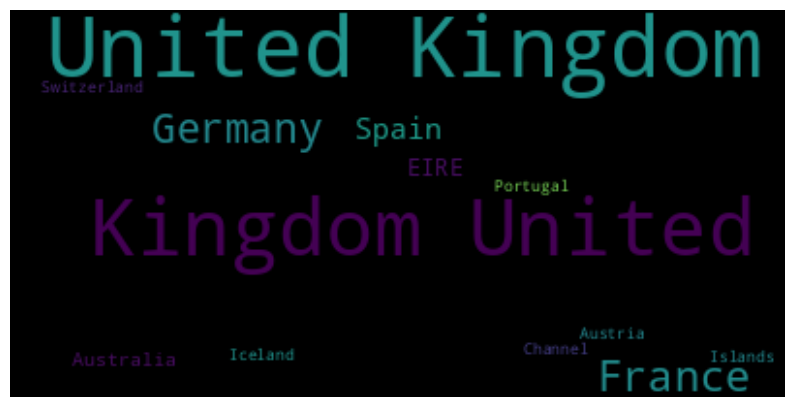

In [946]:
#Analysis of cluster 12
word_count(12)

# ***Evaluation Metrics***

#### **Silhouette Score -**

In [947]:
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

For n_clusters = 2 The average silhouette_score is : 0.03902099169388885
For n_clusters = 3 The average silhouette_score is : 0.05126088723169689
For n_clusters = 4 The average silhouette_score is : 0.06427300405228951
For n_clusters = 5 The average silhouette_score is : 0.07584972222321272
For n_clusters = 6 The average silhouette_score is : 0.08268834097963239
For n_clusters = 7 The average silhouette_score is : 0.09009232336782648
For n_clusters = 8 The average silhouette_score is : 0.1287248705319861
For n_clusters = 9 The average silhouette_score is : 0.13508194146725913
For n_clusters = 10 The average silhouette_score is : 0.13374607124801205
For n_clusters = 11 The average silhouette_score is : 0.12069266842134357
For n_clusters = 12 The average silhouette_score is : 0.12839856561500335
For n_clusters = 13 The average silhouette_score is : 0.13418646598425735
For n_clusters = 14 The average silhouette_score is : 0.13145626069666638
For n_clusters = 15 The average silhouette_scor

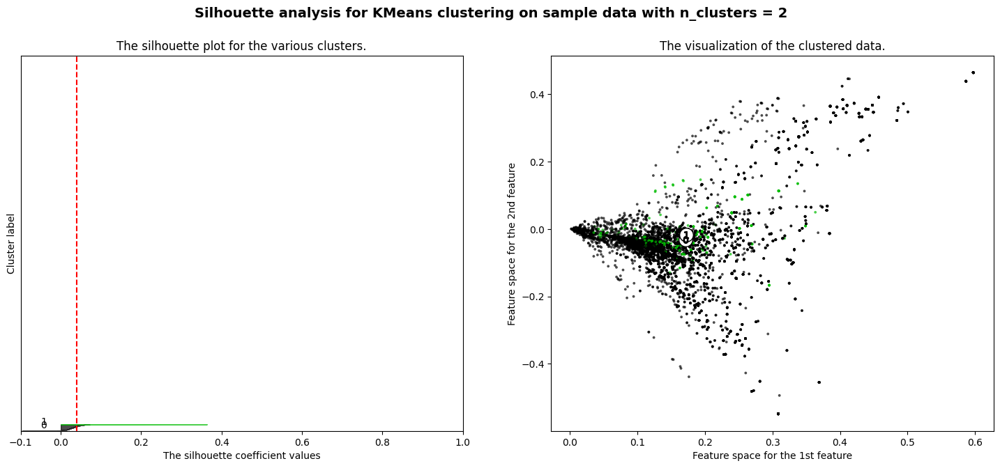

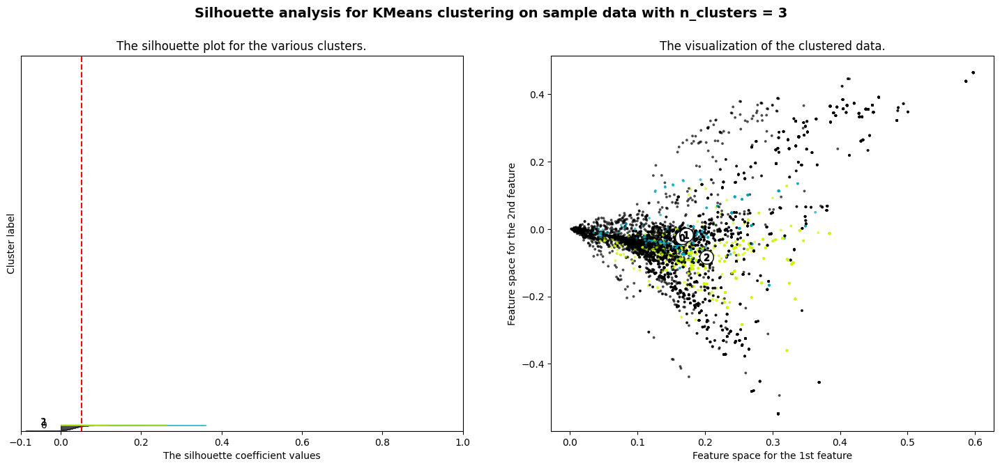

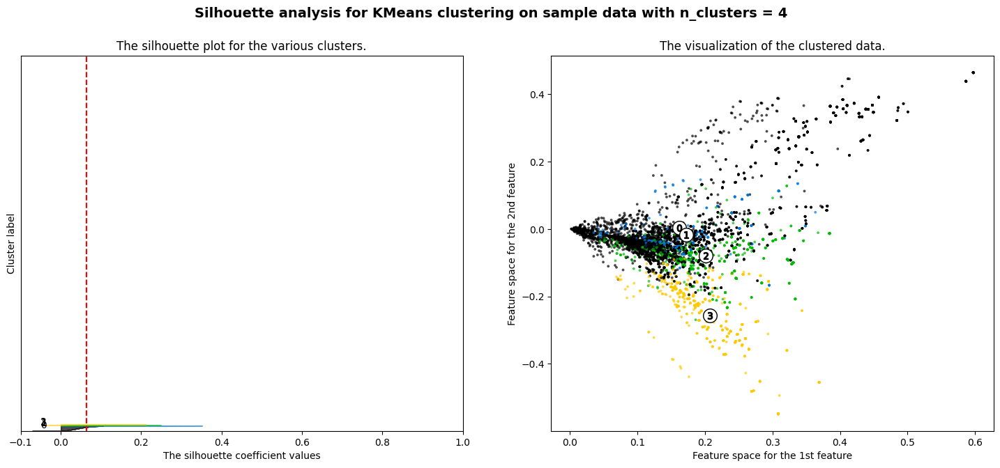

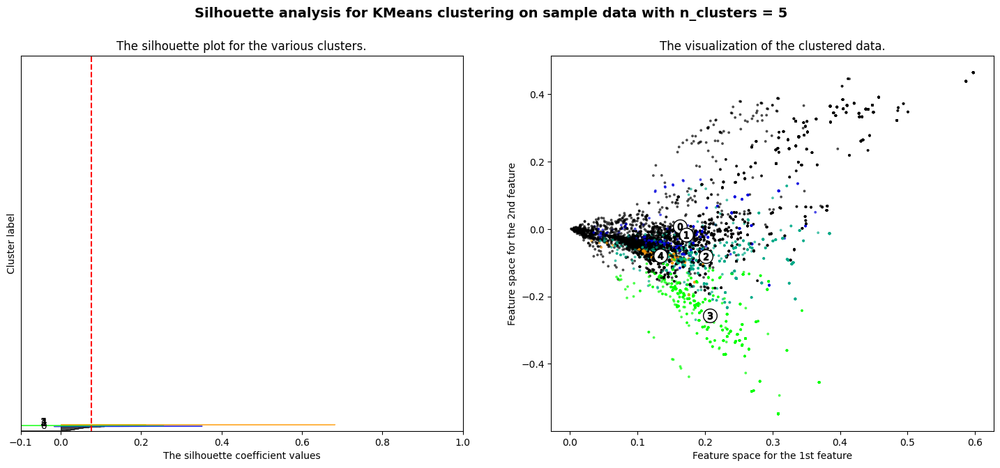

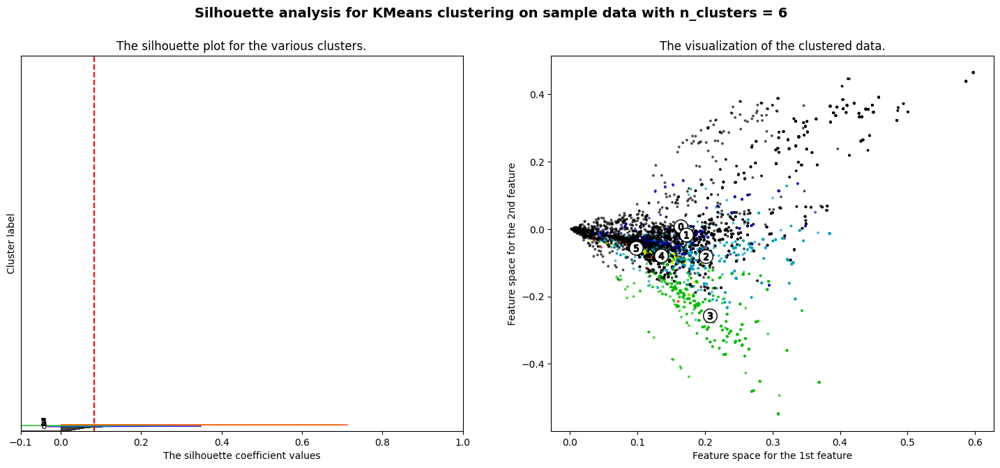

...

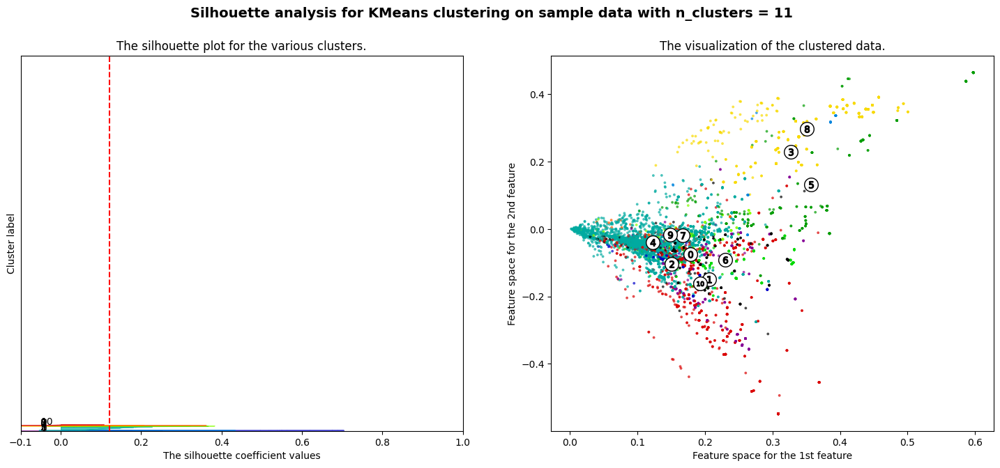

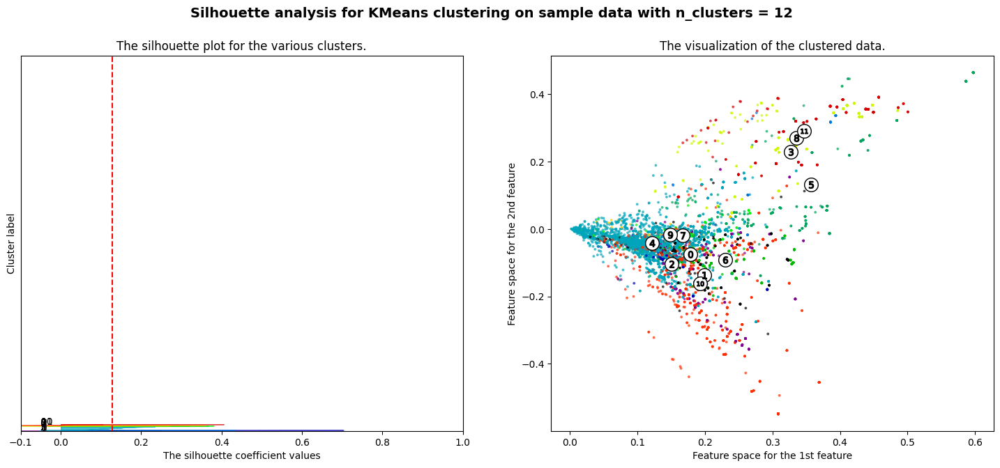

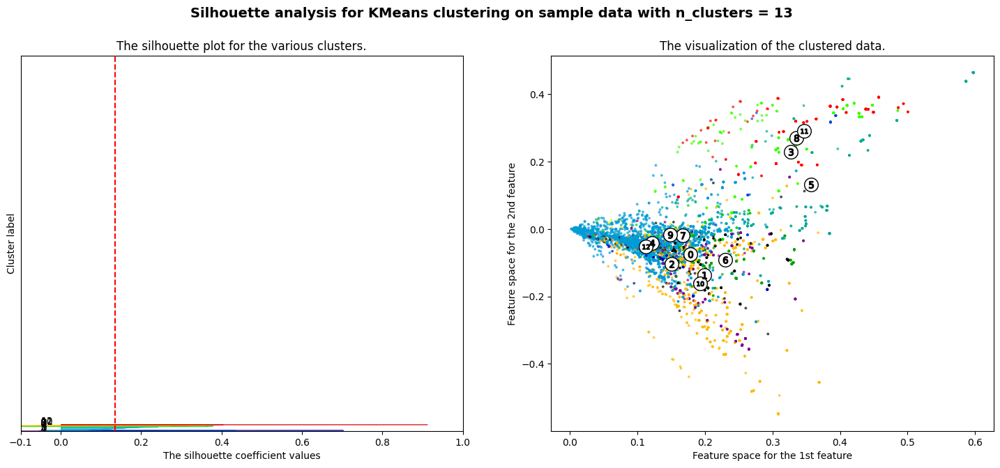

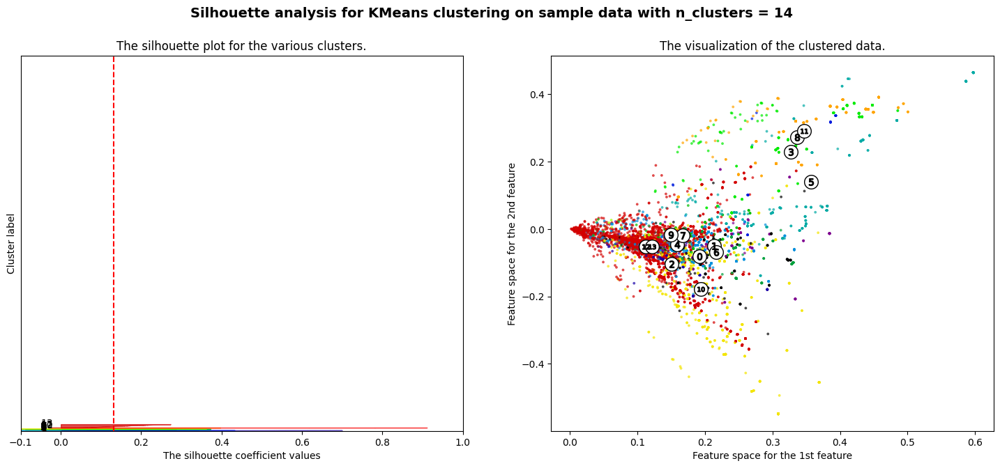

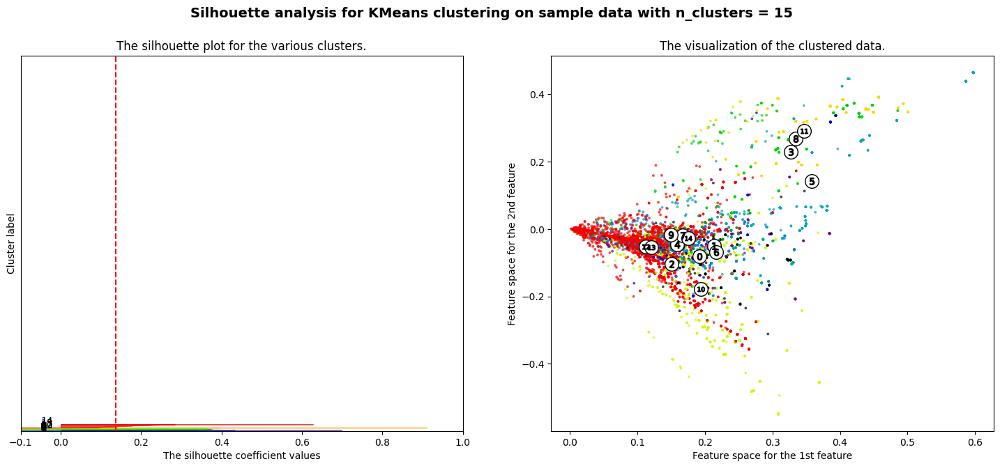

In [948]:
range_n_clusters = [i for i in range(2,16)]
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_sampled)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_sampled, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_sampled, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) /n_clusters)
    ax2.scatter(X_sampled[:, 0], X_sampled[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

# **Conclusion:-**



*   Performed data cleaning by handling missing values, removing duplicates, and filtering outliers.

*  Conducted EDA to explore key trends such as top products, sales peaks, and customer behavior.

*  Identified the United Kingdom as the dominant revenue contributor (81.5%), followed by other European countries.

*  Applied KMeans and Hierarchical clustering to segment customers effectively.

*  Used TruncatedSVD for dimensionality reduction to enhance performance and avoid memory issues.

*  Implemented NLP using TF-IDF on product descriptions to extract meaningful features.

* Visualized monthly sales trends grouped by products to identify best-sellers in each month.

* Evaluated cluster quality using silhouette scores to determine the optimal number of clusters

*  Analyzed the nature of each customer cluster using WordCloud plots for interpretability.


